# Introduction to ANNs

- Readings: Geron, ch. 10 and ss.

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0-preview is required
import tensorflow as tf
assert tf.__version__ >= "2.0"

# Common imports
import numpy as np
import pandas as pd
import os

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Ignore useless warnings (see SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")

## From Biological to Artificial Neurons

- ANNs have been around for quite a while: they were first introduced back in 1943 by the neurophysiologist Warren McCulloch and the mathematician Walter Pitts.
    - Simplified computational model of how biological neurons might work together in animal brains to perform complex computations using propositional logic.
    - But this early attempts did not bring great practical results
    
- We are now witnessing another wave of interest in ANNs.
    - There is now a huge quantity of data available to train neural networks, and ANNs frequently outperform other ML techniques on very large and complex problems.
    - The tremendous increase in computing power since the 1990s now makes it possible to train large neural networks in a reasonable amount of time.
    

### Biological Neurons

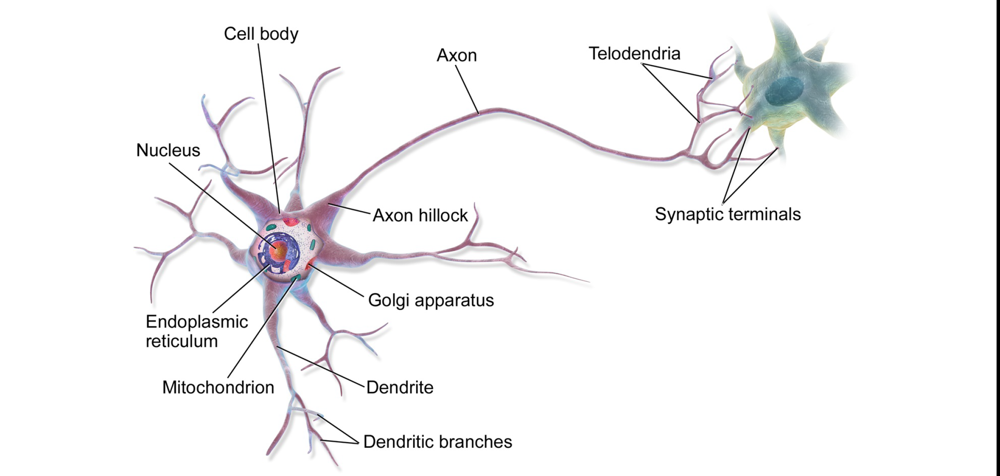

- Biological neurons produce short electrical impulses called **action potentials** which travel along the axons and make the synapses release chemical signals called neurotransmitters.

- When a neuron receives a sufficient amount of these neurotransmitters within a few milliseconds, it fires its own electrical impulses.

- Individual biological neurons behave in a rather simple way, but they are organized in a **vast network of billions**, with each neuron typically connected to thousands of other neurons.

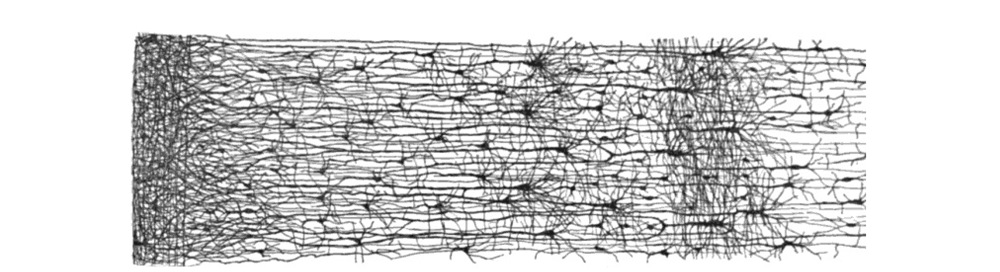

### Logical Computations with Neurons

- McCulloch and Pitts proposed a very simple model of the biological neuron, which later became known as an **artificial neuron**:
    - One or more binary (on/off) inputs and one binary output.
    - The artificial neuron activates its output when more than a certain number of its inputs are active.

- It is possible to build a network of artificial neurons that computes **any logical proposition you want**.

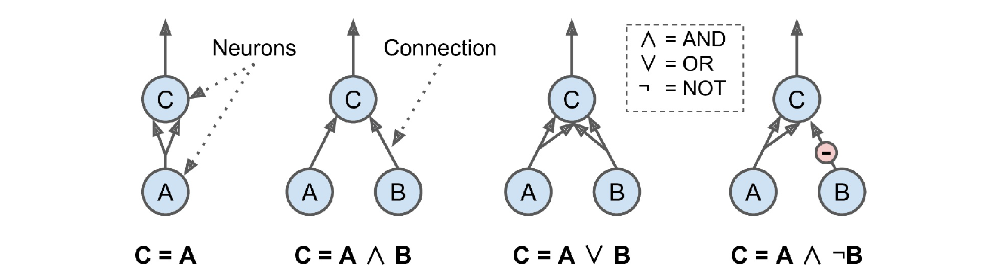

#### Exercise

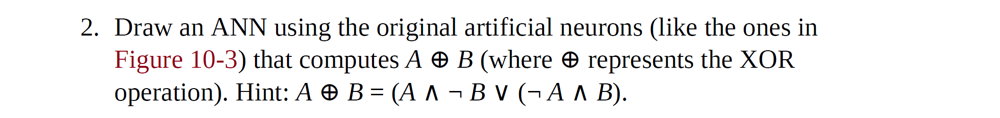

## Perceptrons

- The Perceptron is one of the simplest ANN architectures, invented in 1957 by Frank Rosenblatt.

- It is based on a slightly different artificial neuron called a **threshold logic unit (TLU)** (a.k.a. linear threshold unit or LTU).

    - The inputs and output are numbers (instead of binary on/off values).
    - Each input connection is associated with a weight.

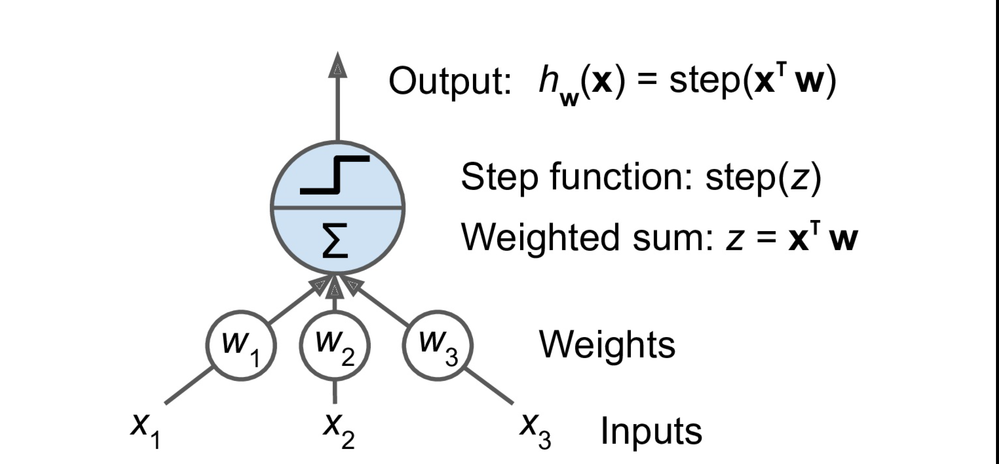

1. The TLU computes a weighted sum of its inputs: 

     $z = w_1 x_1 + w_2 x_2 + \ldots + w_n x_n = \mathbf{x} \cdot\mathbf{w}$


2. The TLU then applies a step function to that sum and outputs the result: 
     
     $h(x) = \mathrm{step}(z)$.

- The most common step function used in Perceptrons is the Heaviside step function.
- But sometimes the sign function is used instead.

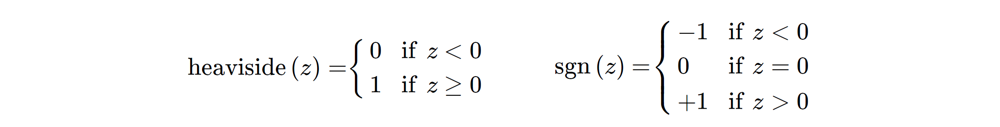

- A single TLU can be used for simple linear binary classification.

    - It computes a linear combination of the inputs, and if the result exceeds a threshold, it outputs the positive class.
    - Otherwise it outputs the negative class.
    

- For example, a single TLU can classify iris flowers based on petal length and width (also adding an extra bias feature $x_0 = 1$).
- Training a TLU in this case means finding the right values for $w_0$, $w_1$, and $w_2$.


- A **Perceptron** is simply composed of a **single layer of TLUs**, with each TLU connected to all the inputs.


- When all the neurons in a layer are connected to every neuron in the previous layer (i.e., its input neurons), the layer is called a **fully connected layer**, or a **dense layer**.


- The inputs of the Perceptron are fed to special passthrough neurons called **input neurons**: they output whatever input they are fed.


- All the input neurons form the **input layer**. 


- The bias feature is typically represented using a **bias neuron**, which outputs 1 all the time.

#### A Perceptron can classify instances simultaneously into three different binary classes (multioutput classifier)

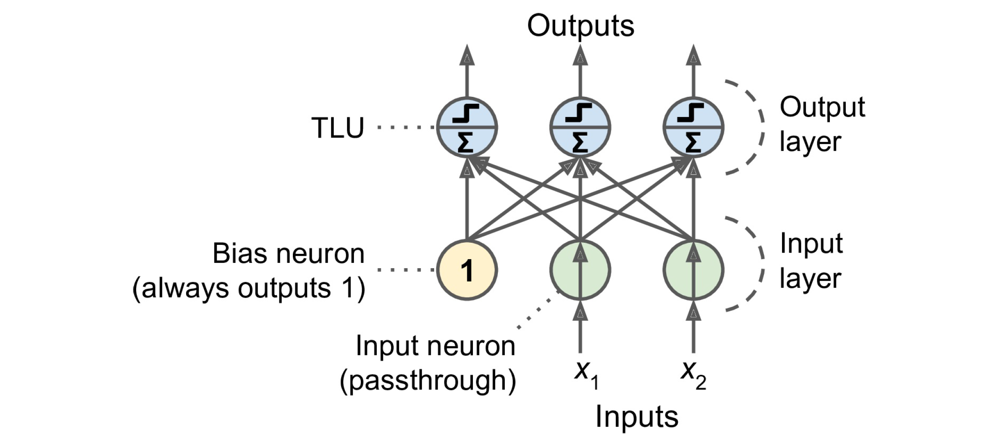

- It possible to efficiently compute the outputs of a layer of artificial neurons for several instances at once.

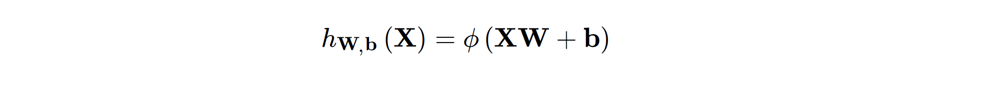

- $\mathbf X$ represents the matrix of input features. It has one row per instance and one column per feature.

- The weight matrix $\mathbf W$ contains all the connection weights except for the ones from the bias neuron. It has one row per input neuron and one column per artificial neuron in the layer.

- The bias vector $\mathbf b$ contains all the connection weights between the bias neuron and the artificial neurons. It has one bias term per artificial neuron.

- The function $\phi$ is called the **activation function**
    - when the artificial neurons are TLUs, it is a step function.

### Training a Perceptron

- The Perceptron training algorithm proposed by Rosenblatt was largely inspired by **Hebb’s rule**.
    D. Hebb suggested that when a biological neuron triggers another neuron often, the connection between these two neurons grows stronger.
    
    “Cells that fire together, wire together”
    

- Perceptrons are trained using a variant of this rule that takes into account the error made by the network when it makes a prediction.

#### The Perceptron learning rule reinforces connections that help reduce the error.

1. The Perceptron is fed one training instance at a time, and for each instance it makes its predictions.

2. For every output neuron that produced a wrong prediction, it reinforces the connection weights from the inputs that would have contributed to the correct prediction.

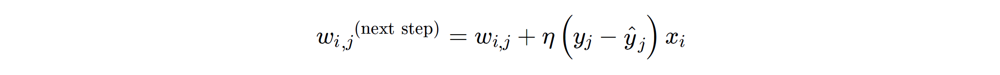

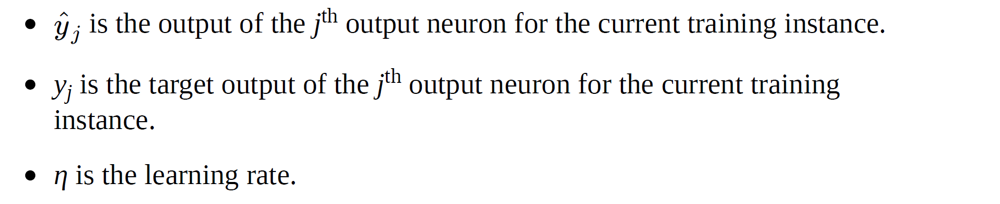

- The **decision boundary of each output neuron is linear**, so Perceptrons are incapable of learning complex patterns (just like Logistic Regression classifiers).

- If the training instances are linearly separable, Rosenblatt
demonstrated that this algorithm would converge to a solution.
    - **The Perceptron convergence theorem**.
    
- Scikit-Learn provides a `Perceptron` class that implements a single-TLU network.

In [3]:
import numpy as np
from sklearn.datasets import load_iris
from sklearn.linear_model import Perceptron

iris = load_iris()
X = iris.data[:, (2, 3)]  # petal length, petal width
y = (iris.target == 0).astype(np.int32)

per_clf = Perceptron(max_iter=1000, tol=1e-3, random_state=42)
per_clf.fit(X, y)

y_pred = per_clf.predict([[2, 0.5]])

Perceptron(random_state=42)

In [4]:
y_pred

array([1])

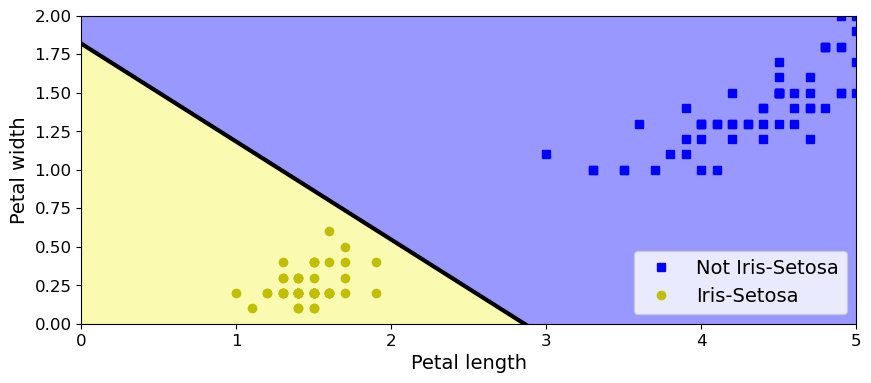

In [5]:
# linear decision boundary
a = -per_clf.coef_[0][0] / per_clf.coef_[0][1]
b = -per_clf.intercept_ / per_clf.coef_[0][1]

# Plot predictions
axes = [0, 5, 0, 2]

x0, x1 = np.meshgrid(
        np.linspace(axes[0], axes[1], 500).reshape(-1, 1),
        np.linspace(axes[2], axes[3], 200).reshape(-1, 1),
    )
X_new = np.c_[x0.ravel(), x1.ravel()]
y_predict = per_clf.predict(X_new)
zz = y_predict.reshape(x0.shape)

plt.figure(figsize=(10, 4));

# scatter
plt.plot(X[y==0, 0], X[y==0, 1], "bs", label="Not Iris-Setosa");
plt.plot(X[y==1, 0], X[y==1, 1], "yo", label="Iris-Setosa");

# boundary
plt.plot([axes[0], axes[1]],
         [a * axes[0] + b, a * axes[1] + b],
         "k-", linewidth=3);

# predictions
from matplotlib.colors import ListedColormap
custom_cmap = ListedColormap(['#9898ff', '#fafab0'])

plt.contourf(x0, x1, zz, cmap=custom_cmap);
plt.xlabel("Petal length", fontsize=14);
plt.ylabel("Petal width", fontsize=14);
plt.legend(loc="lower right", fontsize=14);
plt.axis(axes);

plt.show();

- Scikit-Learn’s `Perceptron` class is equivalent to using an `SGDClassifier` with the following hyperparameters:
`loss="perceptron"`, `learning_rate="constant"`, `eta0=1`, `penalty=None`.


#### Weaknesses of Perceptrons

- Contrary to Logistic Regression classifiers, Perceptrons do not output a class probability; rather, they make predictions based on a hard threshold. **This is one reason to prefer Logistic Regression over Perceptrons**.

- The Perceptrons are incapable of solving some trivial problems (e.g., the Exclusive OR (XOR) classification problem).
- This is true of any other linear classification model (such as Logistic Regression classifiers), but researchers had expected much more from Perceptrons.

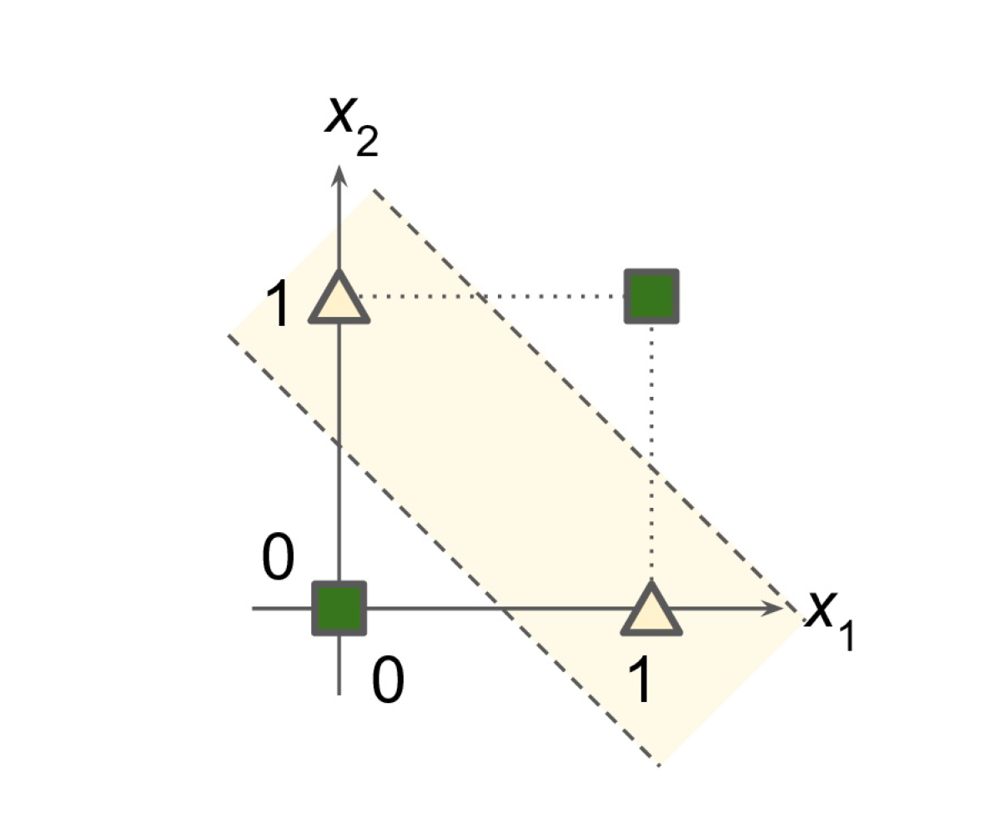

- It turns out that some of the limitations of Perceptrons can be eliminated by **stacking multiple Perceptrons**.

- The resulting ANN is called a **Multilayer Perceptron (MLP)**.

- An MLP can solve the XOR problem:

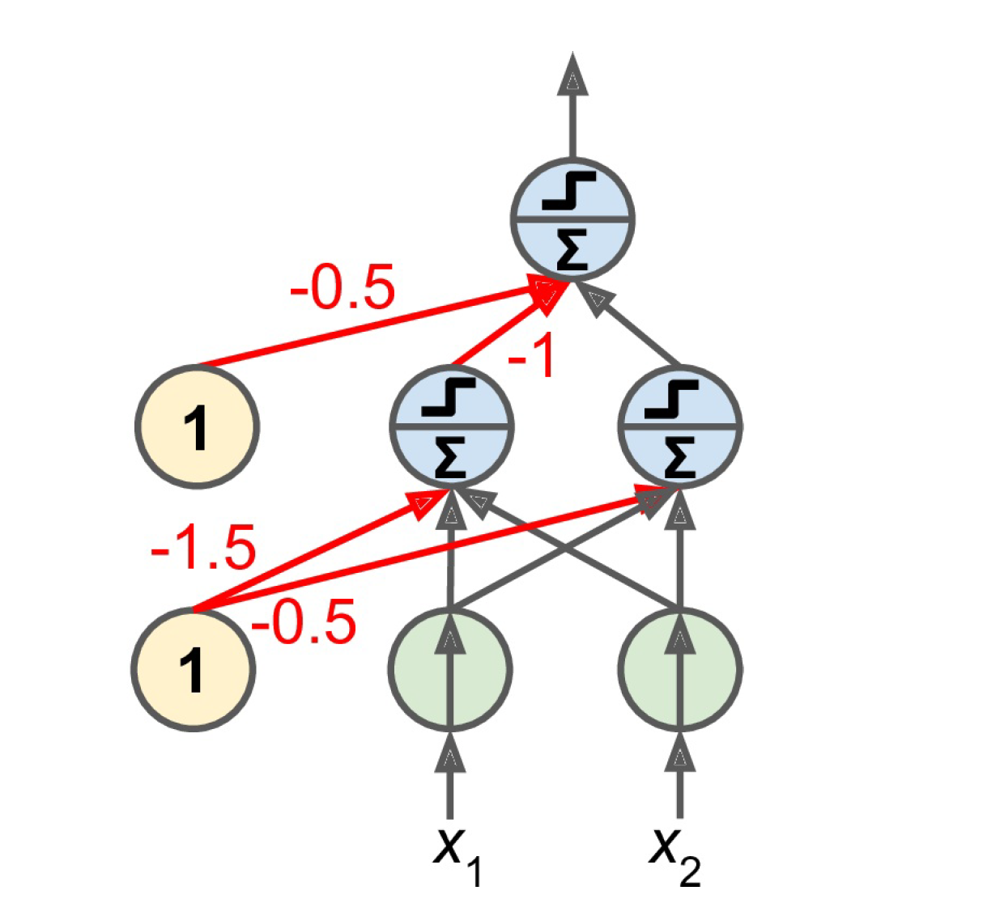

### The Multilayer Perceptron and Backpropagation

- An MLP is composed of one (passthrough) **input layer**, one or more layers of TLUs, called **hidden layers**, and one final layer of TLUs called the **output layer**.

- The layers close to the input layer are usually called the *lower layers*, and the ones close to the outputs are usually called the *upper layers*.

- Every layer except the output layer includes a bias neuron and is fully connected to the next layer.

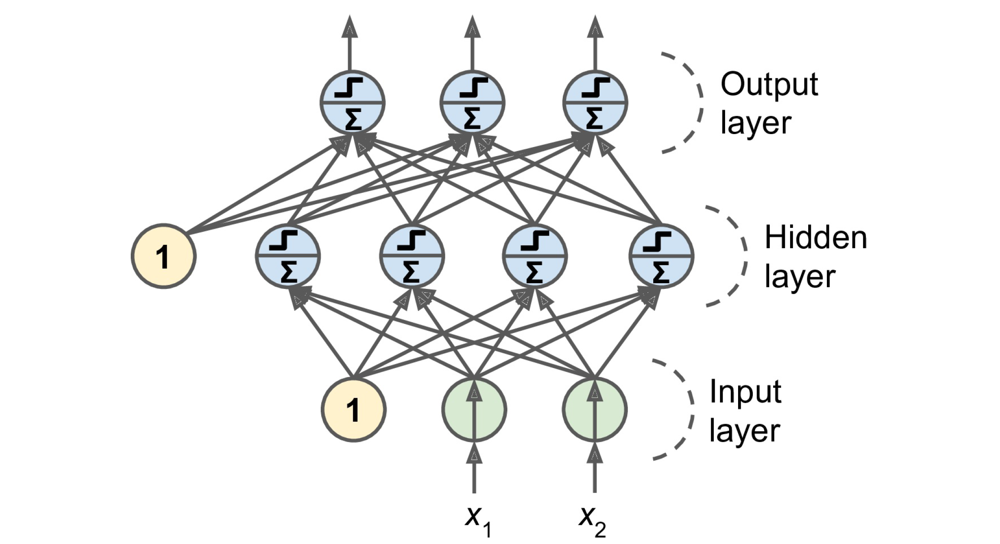

- The signal flows only in one direction (from the inputs to the outputs), so this architecture is an example of a **feedforward neural network (FNN)**.

- When an ANN contains a deep stack of hidden layers, it is called a **deep neural network (DNN)**.
- The field of Deep Learning studies DNNs, and more generally models containing deep stacks of computations.

### Back Propagation

- For many years, researchers struggled to find a way to train MLPs, without success. 

- Gradient descent requires computing the gradients of the model’s error with regard to the model parameters; it wasn’t clear at the time how to do this efficiently with such a complex model containing so many parameters.

- In 1970, Seppo Linnainmaa introduced a technique to compute all the gradients automatically and efficiently: reverse-mode automatic differentiation (or *reverse-mode autodiff*)

- In just two passes through the network (one forward, one backward), it is able to compute the gradients of the neural network’s error with regard to every single model parameter. These gradients can then be used to perform a gradient descent step. 

- The combination of reverse-mode autodiff and gradient descent is called backpropagation (or *backprop* for short).

- Backpropagation can actually be applied to all sorts of computational graphs, not just neural networks. D. Rumelhart, G. Hinton, and R. Williams (1986) introduced the backpropagation training algorithm to ANNs.



#### Back propagation is gradient descent using an efficient technique to calculate gradients 

1. Initialize hidden layers randomly (to avoid symmetry).

2. Handle one mini-batch at a time (full data set is one epoch).

3. Pass the mini-batch through the NN (forward pass), **keeping all intermediate results saved**.

4. Compute error using loss function (sigmoid).

5. Apply the chain rule to determine how much each output connection contributed to the error.
    
    `Reverse-mode auto-diff'
    

6. Go over the previous layers and determine how much of the error contributions come from each connection (reverse pass).

7. Perform a gradient descent step to tweak all the connection.

#### An example of reverse-mode autodiff

$n_7 = f(x,y) = x^2 y + y + 2$

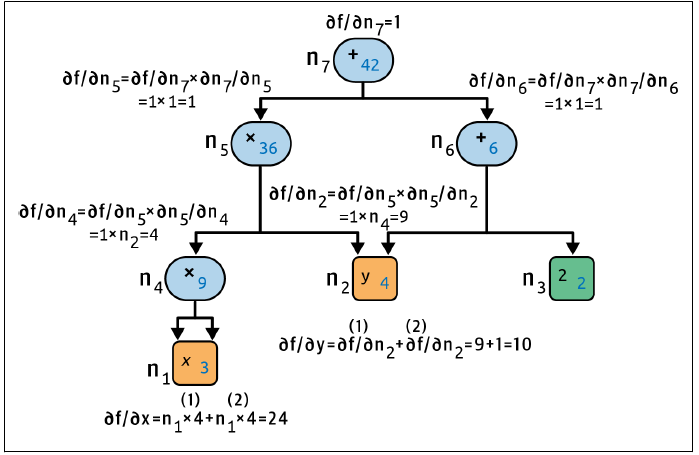

#### Making backprop work

- In order for backprop to work properly, Rumelhart and his colleagues made a key change to the MLP’s architecture: they replaced the step function with the logistic (sigmoid) function, $σ(z)=1/(1+\exp(–z))$

- This was essential because the step function contains only flat segments, so there is no gradient to work with (Gradient Descent cannot move on a flat surface).

- The backpropagation algorithm works well with many other activation functions, not just the logistic function. 

    - The hyperbolic tangent function: $\tanh(z)=2\sigma(2z)–1$ is S-shaped, continuous, and differentiable, just like the logistic function, but its output value ranges from –1 to 1 (instead of 0 to 1).
    
    - The Rectified Linear Unit function: $\mathrm{ReLU}(z) = \max(0, z)$ is continuous but unfortunately not differentiable at z = 0, and its derivative is 0 for z < 0. In practice, however, it works very well and has the advantage of being fast to compute, so it has become the default.
    

#### Activation Functions 

In [6]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

def relu(z):
    return np.maximum(0, z)

def derivative(f, z, eps=0.000001):
    return (f(z + eps) - f(z - eps))/(2 * eps)

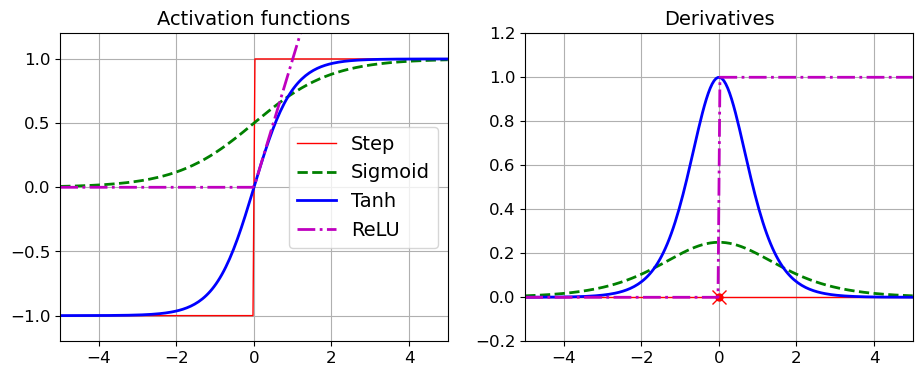

In [7]:
z = np.linspace(-5, 5, 200)

plt.figure(figsize=(11,4));

plt.subplot(121);
plt.plot(z, np.sign(z), "r-", linewidth=1, label="Step");
plt.plot(z, sigmoid(z), "g--", linewidth=2, label="Sigmoid");
plt.plot(z, np.tanh(z), "b-", linewidth=2, label="Tanh");
plt.plot(z, relu(z), "m-.", linewidth=2, label="ReLU");
plt.grid(True);
plt.legend(loc="center right", fontsize=14);
plt.title("Activation functions", fontsize=14);
plt.axis([-5, 5, -1.2, 1.2]);

plt.subplot(122);
plt.plot(z, derivative(np.sign, z), "r-", linewidth=1, label="Step");
plt.plot(0, 0, "ro", markersize=5);
plt.plot(0, 0, "rx", markersize=10);
plt.plot(z, derivative(sigmoid, z), "g--", linewidth=2, label="Sigmoid");
plt.plot(z, derivative(np.tanh, z), "b-", linewidth=2, label="Tanh");
plt.plot(z, derivative(relu, z), "m-.", linewidth=2, label="ReLU");
plt.grid(True);
#plt.legend(loc="center right", fontsize=14)
plt.title("Derivatives", fontsize=14);
plt.axis([-5, 5, -0.2, 1.2]);

plt.show();

#### We need non-linear activation functions because if you chain several linear transformations, all you get is a linear transformation.

#### A large enough DNN with nonlinear activations can theoretically approximate any continuous function.
   http://neuralnetworksanddeeplearning.com/chap4.html

In [8]:
def heaviside(z):
    return (z >= 0).astype(z.dtype)

def mlp_xor(x1, x2, activation=heaviside):
    return activation(-activation(x1 + x2 - 1.5) + activation(x1 + x2 - 0.5) - 0.5)

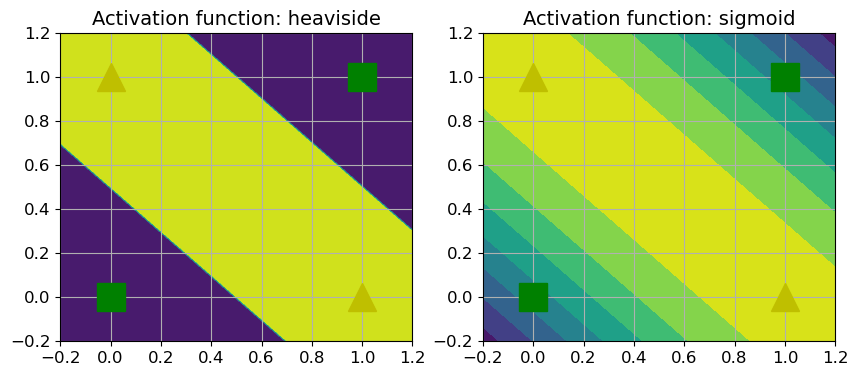

In [9]:
x1s = np.linspace(-0.2, 1.2, 100)
x2s = np.linspace(-0.2, 1.2, 100)
x1, x2 = np.meshgrid(x1s, x2s)

z1 = mlp_xor(x1, x2, activation=heaviside)
z2 = mlp_xor(x1, x2, activation=sigmoid)

plt.figure(figsize=(10,4));

plt.subplot(121);
plt.contourf(x1, x2, z1);
plt.plot([0, 1], [0, 1], "gs", markersize=20);
plt.plot([0, 1], [1, 0], "y^", markersize=20);
plt.title("Activation function: heaviside", fontsize=14);
plt.grid(True);

plt.subplot(122);
plt.contourf(x1, x2, z2);
plt.plot([0, 1], [0, 1], "gs", markersize=20);
plt.plot([0, 1], [1, 0], "y^", markersize=20);
plt.title("Activation function: sigmoid", fontsize=14);
plt.grid(True);

### Regression MLPs

- If you want to predict a single value (e.g., the price of a house), then you just need a
single output neuron: its output is the predicted value.

- For multivariate regression (i.e., to predict multiple values at once), you need one output neuron per output dimension.

    - For example, to locate the center of an object in an image, you need to predict 2D coordinates, so you need two output neurons. 
    - If you also want to place a bounding box around the object, then you need two more numbers: the width and the height of the object
    

- In general, when building an MLP for regression, you **do not want to use any activation function for the output neurons**, so they are free to output any range of
values.

- If you want to guarantee that the output will always be positive, then you can use the $\mathrm{ReLU}$ activation function in the output layer.

- Alternatively, you can use the softplus activation function, which is a smooth variant of ReLU: 
    - $\mathrm{softplus}(z) = \log(1 + \exp(z))$. 
    - It is close to $0$ when $z$ is negative, and close to $z$ when $z$ is positive.

- Finally, if you want to guarantee that the predictions will fall within a given range of values, then you can use the logistic function or the hyperbolic tangent, and then scale the labels to the appropriate range: 0 to 1 for the logistic function and –1 to 1 for the hyperbolic tangent.


- The loss function to use during training is typically the mean squared error.
- If you have a lot of outliers in the training set, you may prefer to use the mean absolute error instead.
- Alternatively, you can use the **Huber loss**, which is a combination of both.

    - The Huber loss is quadratic when the error is smaller than a threshold $\delta$ (typically 1) but linear when the error is larger than $\delta$.
    
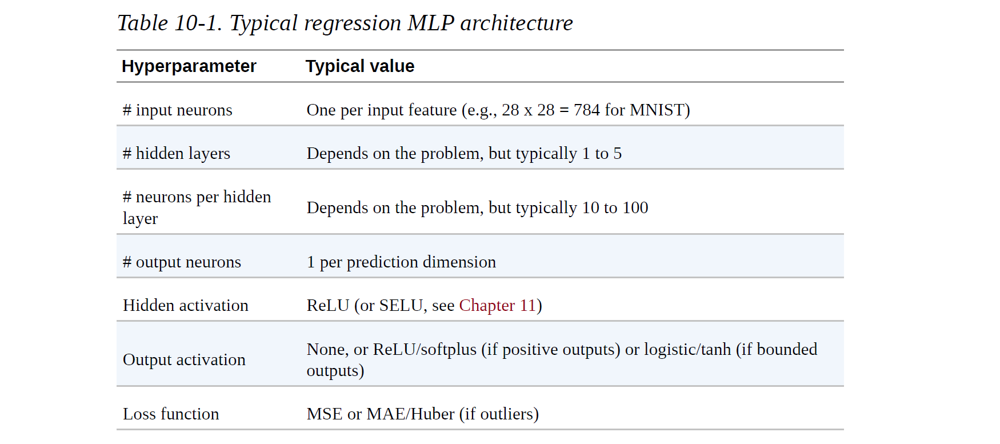

#### An example using Scikit-Learn and the California Housing data

In [8]:
from sklearn.datasets import fetch_california_housing
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

# Download data
housing = fetch_california_housing()

# Test set
X_train_full, X_test, y_train_full, y_test = train_test_split(
                housing.data, housing.target, random_state=42)
# Valid set
X_train, X_valid, y_train, y_valid = train_test_split(
                X_train_full, y_train_full, random_state=42)

# Estimator obj
mlp_reg = MLPRegressor(hidden_layer_sizes=[10, 10, 10, 10], random_state=42)

# Need to standardize features first
pipeline = make_pipeline(StandardScaler(), mlp_reg);
# Train
pipeline.fit(X_train, y_train);

# Predict and evaluate
y_pred = pipeline.predict(X_valid)
rmse = mean_squared_error(y_valid, y_pred, squared=False)

print(f"{y_valid.mean()=:.3f}")
print(f"{rmse=:.3f}")

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('mlpregressor',
                 MLPRegressor(hidden_layer_sizes=[50, 50, 50],
                              random_state=42))])

y_valid.mean()=2.035
rmse=0.505


### Classification MLPs

- For a binary classification problem, you just need a single output neuron using the logistic activation function: the output will be a number between 0 and 1, which you can interpret as the estimated probability of the positive class.

- MLPs can also easily handle multilabel binary classification tasks. You would dedicate one output neuron for each positive class.
    - Note that the output probabilities do not necessarily add up to 1.
    
- If each instance can belong only to a single class (multiclass classification), out of three or more possible classes (e.g., classes 0 through 9 for digit image classification), then you need to have one output neuron per class, and you should use the softmax activation function for the whole output layer.


- The cross-entropy loss is generally a good choice.

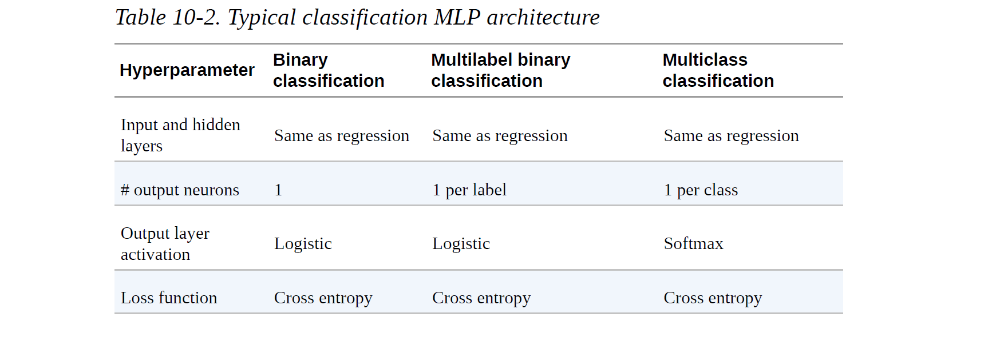

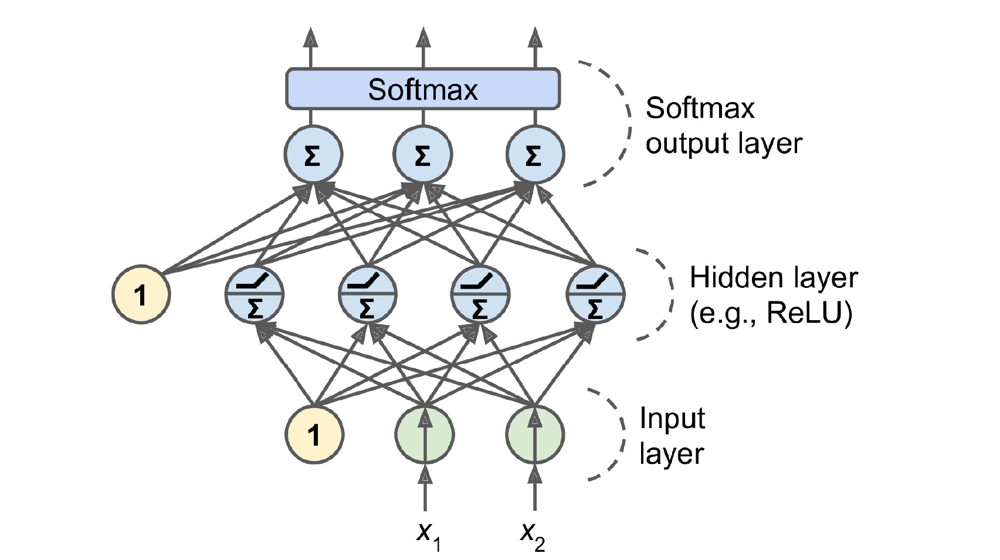

### TensorFlow Playground

The TensorFlow Playground is a handy neural network simulator built
by the TensorFlow team.

https://playground.tensorflow.org/

1. In this **exercise**, you will train several binary classifiers in just a few clicks, and tweak the model’s architecture and its hyperparameters to gain some intuition on how neural networks work and what their hyperparameters do.

    a. The patterns learned by a neural net. Try training the default neural network by clicking the Run button (top left). Notice how it quickly finds a good solution for the classification task. The neurons in the first hidden layer have learned simple patterns, while the neurons in the second hidden layer have learned to combine the simple patterns of the first hidden layer into more complex patterns. In general, the more layers there are, the more complex the patterns can be.
    
    b. Activation functions. Try replacing the tanh activation function with a ReLU activation function, and train the network again. Notice that it finds a solution even faster, but this time the boundaries are linear. This is due to the shape of the ReLU function.
    
    c. The risk of local minima. Modify the network architecture to have just one hidden layer with three neurons. Train it multiple times (to reset the network weights, click the Reset button next to the Play button). Notice that the training time varies a lot, and sometimes it even gets stuck in a local minimum.
    
    d. What happens when neural nets are too small. Remove one neuron to keep just two. Notice that the neural network is now incapable of finding a good solution, even if you try multiple times. The model has too few parameters and systematically underfits the training set.
    
    e. What happens when neural nets are large enough. Set the number of neurons to eight, and train the network several times. Notice that it is now consistently fast and never gets stuck. This highlights an important finding in neural network theory: large neural networks rarely get stuck in local minima, and even when they do these local optima are often almost as good as the global optimum. However, they can still get stuck on long plateaus for a long time.
    
    f. The risk of vanishing gradients in deep networks. Select the spiral dataset (the bottom-right dataset under “DATA”), and change the network architecture to have four hidden layers with eight neurons each. Notice that training takes much longer and often gets stuck on plateaus for long periods of time. Also notice that the neurons in the highest layers (on the right) tend to evolve faster than the neurons in the lowest layers (on the left). This problem, called the vanishing gradients problem, can be alleviated with better weight initialization and other techniques, better optimizers (such as AdaGrad or Adam), or batch normalization.
   

## Implementing MLPs using Keras

- `Keras` is TensorFlow's high-level Deep Learning API. It allows you to easily build, train, evaluate, and execute all sorts of neural networks.

- The original Keras was released by F. Chollet in 2015.

- Keras used to support multiple computational backends. But since version 2.4, Keras is TensorFlow-only.

- The most popular Deep Learning library, after Keras and TensorFlow, is Facebook’s `PyTorch` library.

### Building an Image Classifier Using the Sequential API

First let's import TensorFlow and Keras.

In [10]:
import tensorflow as tf
from tensorflow import keras

In [11]:
tf.__version__

'2.10.0'

We will tackle Fashion MNIST, which has the exact same format as MNIST (70,000 grayscale images of 28 × 28 pixels each, with 10 classes), but the images represent fashion items rather than handwritten digits, so each class is more diverse.


Keras provides some utility functions to fetch and load common datasets,
including MNIST, Fashion MNIST, and the California housing datase.

In [9]:
fashion_mnist = keras.datasets.fashion_mnist.load_data()
(X_train_full, y_train_full), (X_test, y_test) = fashion_mnist
X_train, y_train = X_train_full[:-5000], y_train_full[:-5000]
X_valid, y_valid = X_train_full[-5000:], y_train_full[-5000:]

- The dataset is already split into a training set and a test set, but there is no validation set.

- Additionally, since we are going to train using Gradient Descent, **we must scale the input features**.

- For simplicity, we’ll scale the pixel intensities down to the 0–1 range by dividing them by 255.0 (this also converts them to floats).

In [10]:
X_train.shape, X_valid.shape, X_test.shape

((55000, 28, 28), (5000, 28, 28), (10000, 28, 28))

In [11]:
y_train.shape, y_valid.shape, y_test.shape

((55000,), (5000,), (10000,))

In [12]:
X_train.dtype

dtype('uint8')

In [13]:
y_test[:20]

array([9, 2, 1, 1, 6, 1, 4, 6, 5, 7, 4, 5, 7, 3, 4, 1, 2, 4, 8, 0],
      dtype=uint8)

In [14]:
X_train, X_valid, X_test = X_train / 255.0, X_valid / 255.0, X_test/255.0

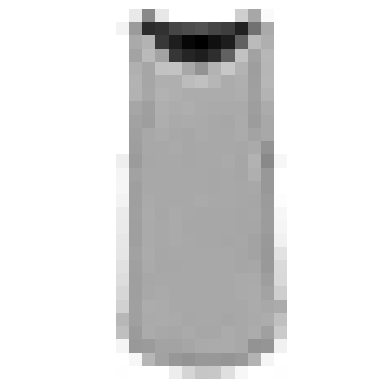

In [15]:
plt.imshow(X_train[2], cmap="binary");
plt.axis('off');
plt.show();

In [16]:
class_names = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat",
               "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]

In [17]:
class_names[y_train[2]]

'T-shirt/top'

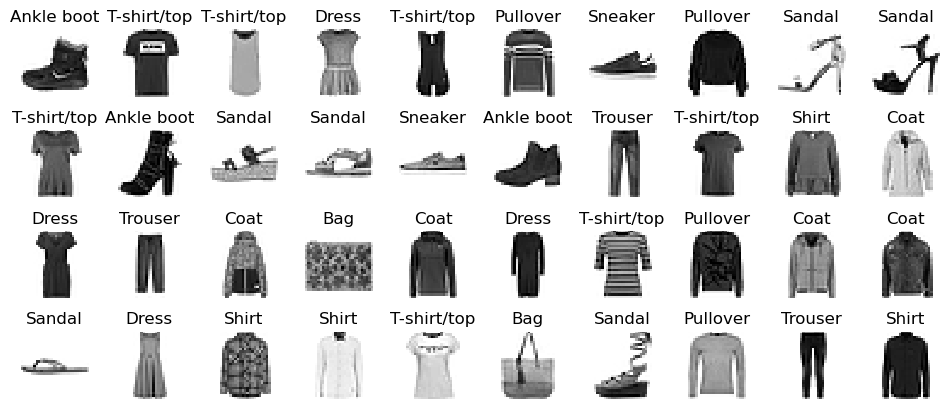

In [18]:
n_rows = 4
n_cols = 10
plt.figure(figsize=(n_cols * 1.2, n_rows * 1.2))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index + 1);
        plt.imshow(X_train[index], cmap="binary", interpolation="nearest");
        plt.axis('off');
        plt.title(class_names[y_train[index]], fontsize=12);
plt.subplots_adjust(wspace=0.2, hspace=0.5);

plt.show();

#### Creating the model using the Sequential API

Here is a classification MLP with two hidden layers:

In [19]:
28**2

784

In [37]:
# Set the seed for reproducibility
tf.keras.utils.set_random_seed(42)  # tf + np + py

# Create a Sequential model
model = keras.models.Sequential()  # stack of layers

# First (input) layer
model.add(keras.layers.Input(shape=[28, 28], name="Input"))
# Flattern inputs
model.add(keras.layers.Flatten(name="Flatten"))

# Hidden layers
model.add(keras.layers.Dense(300, activation="relu", name="Hidden_1"))
model.add(keras.layers.Dense(100, activation="relu", name="Hidden_2"))

# Output layer
model.add(keras.layers.Dense(10, activation="softmax", name="Output"))

- The `Sequential` model is the simplest kind of Keras model for neural networks that are just composed of a single stack of layers connected sequentially.

    - This is called the Sequential API.

- The first layer is an `Input` layer whose role is to take in the inputs. We need to let Keras know the shape, so it can correctly set up connections across layers. The batch size is detected during training.

- We add a `Flatten` layer to convert each input image into a 1D array: if it receives a batch of shape [32,28,28], it will reshape it to [32,784].
    - This layer does not have any parameters; it is just there to do some simple preprocessing.

- Next we add a `Dense` hidden layer with 300 neurons.
    - It will use the ReLU activation function.
    - Each `Dense` layer manages its own weight matrix, containing all the connection weights between the neurons and their inputs.
    - It also manages a vector of bias terms (one per neuron).

- Then we add a second `Dense' layer with 100 neurons.

- Finally, we add a `Dense` output layer with 10 neurons (one per class), using the softmax activation function (because the classes are exclusive).
    - Other activation functions in the keras.activations package:
    https://keras.io/activations/.

Instead of adding the layers one by one as we just did, you can pass a list of
layers when creating the Sequential model:

In [20]:
model_alt = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28], name="input",),
    keras.layers.Dense(300, activation="relu", name="first_hidden", ),
    keras.layers.Dense(100, activation="relu", name="second_hidden"),
    keras.layers.Dense(10, activation="softmax", name="output")
])

The model’s `summary()` method displays all the model’s layers:

    - each layer’s name (automatically generated unless you set it)
    - its output shape (`None` means the batch size can be anything)
    - its number of parameters.
    
The summary ends with the total number of parameters, including trainable and non-trainable parameters.

In [26]:
785 * 300

235500

In [25]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Flatten (Flatten)           (32, 784)                 0         
                                                                 
 Hidden_1 (Dense)            (32, 300)                 235500    
                                                                 
 Hidden_2 (Dense)            (32, 100)                 30100     
                                                                 
 Output (Dense)              (32, 10)                  1010      
                                                                 
Total params: 266,610
Trainable params: 266,610
Non-trainable params: 0
_________________________________________________________________


In [27]:
!pip install -q pydot 

In [29]:
keras.utils.plot_model(model, "my_mnist_model.png", show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [30]:
# List of model layers
model.layers

In [31]:
# A specific layer
hidden1 = model.layers[1]
hidden1.name

'Hidden_1'

In [44]:
model.get_layer(hidden1.name) is hidden1

True

In [32]:
# A layer's weights and biases
weights, biases = hidden1.get_weights()

In [46]:
weights.shape
biases.shape

(784, 300)

(300,)

In [33]:
type(weights)

numpy.ndarray

- The `Dense` layer initializes the connection weights randomly, and the biases are initialized to zeros.

- If you ever want to use a different initialization method, you can set `kernel_initializer` (kernel = W-matrix) or `bias_initializer` when creating the layer.

https://keras.io/initializers/.

#### Compiling the model

- After a model is created, you must call its `compile()` method to specify the loss
function and the optimizer to use.

- Optionally, you can specify a list of extra metrics to compute during training and evaluation:

In [38]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer="sgd",
              metrics=["accuracy"])

- Verbose way:

```python
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.SGD(learning_rate=0.01),
              metrics=[keras.metrics.sparse_categorical_accuracy])
```

- For the full lists, see
https://keras.io/losses, https://keras.io/optimizers, and https://keras.io/metrics.

- We use the "sparse_categorical_crossentropy" loss because we have sparse labels (i.e., for each instance, there is just a target class index, from 0 to 9 in this case), and the classes are exclusive.

- If instead we had one target probability per class for each instance (such as one-hot vectors, e.g., [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.] to represent class 3), then we would need to use the "categorical_crossentropy" loss instead.


#### Training and evaluating the model

The model is ready to be trained. For this we simply need to call its `fit()`
method:

In [39]:
history = model.fit(X_train, y_train, epochs=2,
                    validation_data=(X_valid, y_valid))

Epoch 1/2
1719/1719 [==============================] - 7s 3ms/step - loss: 0.7239 - accuracy: 0.7616 - val_loss: 0.5026 - val_accuracy: 0.8298
Epoch 2/2
1719/1719 [==============================] - 6s 3ms/step - loss: 0.4890 - accuracy: 0.8304 - val_loss: 0.4499 - val_accuracy: 0.8368


The `fit()` method returns a `History` object containing:

    - the training parameters (history.params),
    - the list of epochs it went through (history.epoch), and
    - most importantly a dictionary (history.history) containing the loss and extra metrics it measured at the end of each epoch.

In [40]:
print(history.params)
print(history.epoch)
print(history.history.keys())
print(history.history['loss'])


{'verbose': 1, 'epochs': 2, 'steps': 1719}
[0, 1]
dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])
[0.7239435315132141, 0.48897379636764526]


In [69]:
# Batch size is 32 by default
55000/32

1718.75

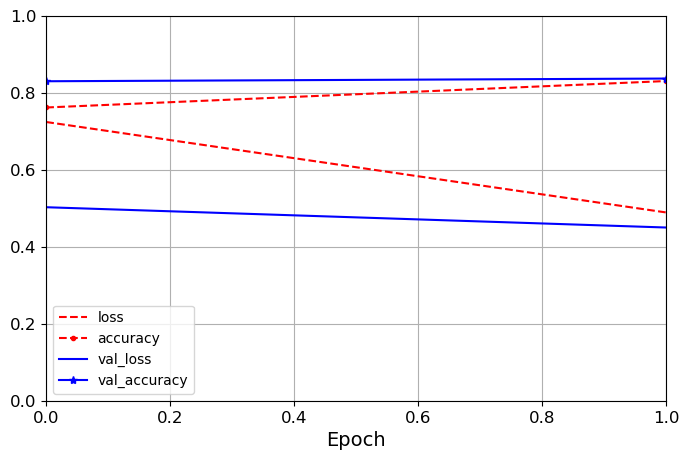

In [41]:
pd.DataFrame(history.history).plot(figsize=(8, 5),
                                   xlim=[0, len(history.epoch)-1],
                                   ylim=[0, 1],
                                   grid=True, xlabel="Epoch",
                                   style=["r--", "r--.", "b-", "b-*"]);
plt.show();

- If you are not satisfied with the performance of your model, you should go back
and tune the hyperparameters.


- Once you are satisfied with your model’s validation accuracy, you should evaluate it on the test set to estimate the generalization error before you deploy
the model to production.

- You can easily do this using the `evaluate()` method:

In [42]:
model.evaluate(X_test, y_test)

313/313 [==============================] - 1s 3ms/step - loss: 0.4912 - accuracy: 0.8238


[0.4912254810333252, 0.8238000273704529]

#### Using the model to make predictions

- Next, we can use the model’s `predict()` method to make predictions on new instances.

- Since we don’t have actual new instances, we will just use the first three instances of the test set:

In [43]:
X_new = X_test[:3]
y_proba = model.predict(X_new)
y_proba.round(2)

1/1 [==============================] - 0s 139ms/step


array([[0.  , 0.  , 0.  , 0.  , 0.  , 0.18, 0.  , 0.18, 0.01, 0.63],
       [0.  , 0.  , 0.92, 0.  , 0.01, 0.  , 0.06, 0.  , 0.  , 0.  ],
       [0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ]],
      dtype=float32)

If you only care about the class with the highest estimated probability (even if that probability is quite low):

In [76]:
y_pred = y_proba.argmax(axis=1)
y_pred

array([9, 2, 1], dtype=int64)

In [82]:
np.array(class_names)[y_pred]

array(['Ankle boot', 'Pullover', 'Trouser'], dtype='<U11')

In [78]:
y_new = y_test[:3]
y_new

array([9, 2, 1], dtype=uint8)

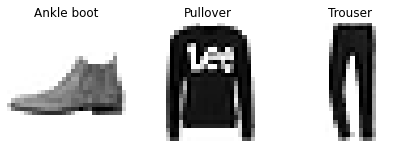

In [79]:
plt.figure(figsize=(7.2, 2.4));
for index, image in enumerate(X_new):
    plt.subplot(1, 3, index + 1);
    plt.imshow(image, cmap="binary", interpolation="nearest");
    plt.axis('off');
    plt.title(class_names[y_test[index]], fontsize=12);
plt.subplots_adjust(wspace=0.2, hspace=0.5);

plt.show();

### Building a Regression MLP Using the Sequential API


- Let’s switch to the California housing problem and tackle it using a regression neural network.

- We will use Scikit-Learn’s fetch_california_housing() function to load the data. This dataset contains only numerical features and there is no missing value.

- After loading the data, we split it into a training set, a validation set, and a test set, and we scale all the features:

In [13]:
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

housing = fetch_california_housing()

X_train_full, X_test, y_train_full, y_test = train_test_split(housing.data,
                                                              housing.target,
                                                              random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train_full,
                                                      y_train_full,
                                                      random_state=42)



- Using the Sequential API to build, train, evaluate, and use a regression MLP to make predictions is quite similar to what we did for classification.

- The main differences are the fact that the output layer has a single neuron (since we only want to predict a single value) and uses no activation function, and the loss function is the mean squared error.

- We don’t need a `Flatten` layer, and instead we’re using a `Normalization` layer as the first layer: it does the same thing as Scikit-Learn’s `StandardScaler`, but it must be fitted to the training data using its `adapt()` method before you call the model’s `fit()` method

In [8]:
X_train.shape[1:]

(8,)

In [14]:
tf.random.set_seed(42)

# Normalization Layer
norm_layer = tf.keras.layers.Normalization(input_shape=X_train.shape[1:])

model_California = tf.keras.Sequential([
        norm_layer,
        tf.keras.layers.Dense(50, activation="relu"),
        tf.keras.layers.Dense(50, activation="relu"),
        tf.keras.layers.Dense(50, activation="relu"),
        tf.keras.layers.Dense(1)
        ])

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)

In [15]:
model_California.compile(loss="mse",
              optimizer=optimizer,
              metrics=["RootMeanSquaredError",])

In [16]:
# "train" the normalization layer
norm_layer.adapt(X_train)

In [17]:
model_California.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 8)                17        
 n)                                                              
                                                                 
 dense (Dense)               (None, 50)                450       
                                                                 
 dense_1 (Dense)             (None, 50)                2550      
                                                                 
 dense_2 (Dense)             (None, 50)                2550      
                                                                 
 dense_3 (Dense)             (None, 1)                 51        
                                                                 
Total params: 5,618
Trainable params: 5,601
Non-trainable params: 17
_____________________________________________________

In [56]:
history = model_California.fit(X_train, y_train, epochs=5,
                    validation_data=(X_valid, y_valid))

Epoch 1/5
363/363 [==============================] - 2s 4ms/step - loss: 0.8393 - root_mean_squared_error: 0.9161 - val_loss: 0.5253 - val_root_mean_squared_error: 0.7248
Epoch 2/5
363/363 [==============================] - 1s 4ms/step - loss: 0.3794 - root_mean_squared_error: 0.6160 - val_loss: 0.5726 - val_root_mean_squared_error: 0.7567
Epoch 3/5
363/363 [==============================] - 1s 3ms/step - loss: 0.3607 - root_mean_squared_error: 0.6006 - val_loss: 0.3214 - val_root_mean_squared_error: 0.5670
Epoch 4/5
363/363 [==============================] - 1s 4ms/step - loss: 0.3372 - root_mean_squared_error: 0.5807 - val_loss: 0.3655 - val_root_mean_squared_error: 0.6046
Epoch 5/5
363/363 [==============================] - 1s 4ms/step - loss: 0.3246 - root_mean_squared_error: 0.5697 - val_loss: 0.6491 - val_root_mean_squared_error: 0.8057


In [57]:
mse_test, rmse_test = model_California.evaluate(X_test, y_test)
print(mse_test, rmse_test)

162/162 [==============================] - 0s 3ms/step - loss: 0.3219 - root_mean_squared_error: 0.5674
0.3219345808029175 0.5673927664756775


In [58]:
X_new = X_test[:3]
y_pred = model_California.predict(X_new)

1/1 [==============================] - 0s 82ms/step


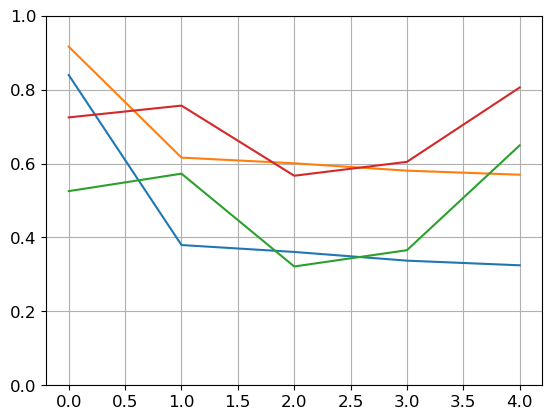

In [59]:
plt.plot(pd.DataFrame(history.history));
plt.grid(True);
plt.gca().set_ylim(0, 1);
plt.show();

### Building Complex Models: the Functional API

- Not all neural network models are simply sequential. Some may have complex topologies. Some may have multiple inputs and/or multiple outputs.

- For example, a **Wide & Deep** neural network (see [paper](https://ai.google/research/pubs/pub45413)) connects all or part of the inputs directly to the output layer.

- This architecture makes it possible for the neural network to learn both deep patterns (using the deep path) and simple rules (through the short path).

- In contrast, a regular MLP forces all the data to flow through the full stack of layers; thus, simple patterns in the data may end up being distorted by this sequence of transformations.

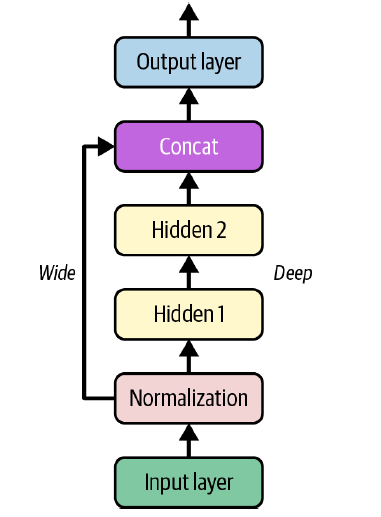

In [12]:
# Wide and Deep Architecture

# Input 
input_layer = keras.layers.Input(shape=X_train.shape[1:], name="Input")

# Normalization
normalization_layer = keras.layers.Normalization()

# Dense hidden layers
hidden_layer1 = keras.layers.Dense(30, activation="relu")
hidden_layer2 = keras.layers.Dense(30, activation="relu")

# Concatenate layer
concat_layer = keras.layers.Concatenate()

# Output layer
output_layer = keras.layers.Dense(1)

NameError: name 'X_train' is not defined

In [25]:
# Now let's use the FUNCTIONAL API

normalized = normalization_layer(input_layer)
hidden1 = hidden_layer1(normalized)
hidden2 = hidden_layer2(hidden1)
concat = concat_layer([normalized, hidden2])
output = output_layer(concat)

In [26]:
# Only now we create the Model object
model = keras.models.Model(inputs=[input_layer], outputs=[output])

- As soon as the hidden layer is created, we call it like a function, passing it the input. 
    - This is why this is called the Functional API.
    - We are just telling Keras how it should connect the layers together; no actual data is being processed yet.
    

- Instead of the `Concatenate` layer, you may prefer the `keras.layers.concatenate()` function, which creates a Concatenate layer and immediately calls it with the given inputs.


- When creating a Keras `Model`, we must now specify which inputs and outputs to use.

In [27]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 8)]          0           []                               
                                                                                                  
 normalization_2 (Normalization  (None, 8)           17          ['Input[0][0]']                  
 )                                                                                                
                                                                                                  
 dense_7 (Dense)                (None, 30)           270         ['normalization_2[0][0]']        
                                                                                                  
 dense_8 (Dense)                (None, 30)           930         ['dense_7[0][0]']          

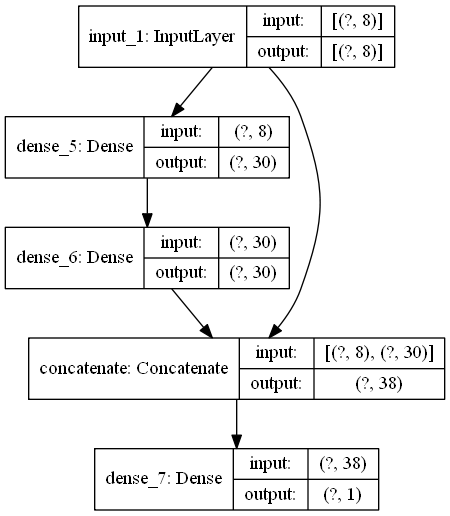

In [43]:
keras.utils.plot_model(model, "my_func_model.png", show_shapes=True)

Once you have built the Keras model, everything is exactly like earlier: you must compile the model, train it, evaluate it, and use it to make predictions.

In [101]:
model.compile(loss="mean_squared_error", optimizer=keras.optimizers.SGD(learning_rate=1e-3))
history = model.fit(X_train, y_train, epochs=10,
                    validation_data=(X_valid, y_valid))
mse_test = model.evaluate(X_test, y_test)
y_pred = model.predict(X_new)

Epoch 1/10
363/363 [==============================] - 1s 2ms/step - loss: nan - val_loss: nan
Epoch 2/10
363/363 [==============================] - 1s 2ms/step - loss: nan - val_loss: nan
Epoch 3/10
363/363 [==============================] - 1s 2ms/step - loss: nan - val_loss: nan
Epoch 4/10
363/363 [==============================] - 1s 2ms/step - loss: nan - val_loss: nan
Epoch 5/10
363/363 [==============================] - 1s 2ms/step - loss: nan - val_loss: nan
Epoch 6/10
363/363 [==============================] - 1s 2ms/step - loss: nan - val_loss: nan
Epoch 7/10
363/363 [==============================] - 1s 2ms/step - loss: nan - val_loss: nan
Epoch 8/10
363/363 [==============================] - 1s 2ms/step - loss: nan - val_loss: nan
Epoch 9/10
363/363 [==============================] - 1s 2ms/step - loss: nan - val_loss: nan
Epoch 10/10
1/1 [==============================] - 0s 96ms/step


- What if you want to send a subset of the features through the wide path and a
different subset (possibly overlapping) through the deep path?

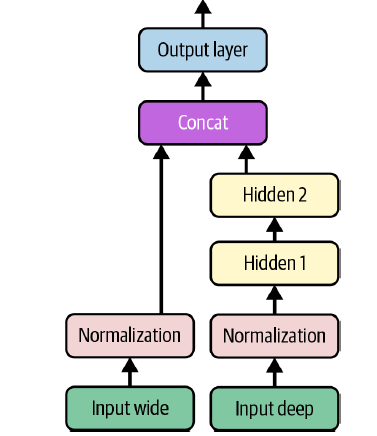

- One solution is to use multiple inputs. 
    - For example, suppose we want to send five features through the wide path (features 0 to 4), and six features through the deep path (features 2 to 7):

In [105]:
# Inputs
input_wide = keras.layers.Input(shape=[5], name="wide_input")   # good idea to name inputs
input_deep = keras.layers.Input(shape=[6], name="deep_input")

# Normalization
norm_layer_wide = keras.layers.Normalization()
norm_layer_deep = keras.layers.Normalization()

# Normalization
norm_wide = norm_layer_wide(input_wide)
norm_deep = norm_layer_deep(input_deep)

# Hidden layers
hidden1 = keras.layers.Dense(30, activation="relu")(norm_deep)
hidden2 = keras.layers.Dense(30, activation="relu")(hidden1)
concat = keras.layers.concatenate([norm_wide, hidden2])
output = keras.layers.Dense(1, name="output")(concat)

# Now we need to let the Model know about multiple inputs
model = keras.models.Model(inputs=[input_wide, input_deep], outputs=[output])

In [109]:
# Compilation is not affected 
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
model.compile(loss="mse", optimizer=optimizer, metrics=["RootMeanSquaredError"])

# We need to split the training/valid sets to match the Model Inputs
X_train_wide, X_train_deep = X_train[:, :5], X_train[:, 2:]
X_valid_wide, X_valid_deep = X_valid[:, :5], X_valid[:, 2:]
X_test_wide, X_test_deep = X_test[:, :5], X_test[:, 2:]
X_new_wide, X_new_deep = X_test_A[:3], X_test_B[:3]

# Adapt
norm_layer_wide.adapt(X_train_wide)
norm_layer_deep.adapt(X_train_deep)

# We pass a tuple of inputs to the fit method
history = model.fit((X_train_wide, X_train_deep), y_train, epochs=10,
                    validation_data=((X_valid_wide, X_valid_deep), y_valid))

Epoch 1/10
363/363 [==============================] - 1s 2ms/step - loss: 0.3096 - root_mean_squared_error: 0.5564 - val_loss: 0.2980 - val_root_mean_squared_error: 0.5459
Epoch 2/10
363/363 [==============================] - 1s 2ms/step - loss: 0.3099 - root_mean_squared_error: 0.5567 - val_loss: 1.0221 - val_root_mean_squared_error: 1.0110
Epoch 3/10
363/363 [==============================] - 1s 2ms/step - loss: 0.3091 - root_mean_squared_error: 0.5559 - val_loss: 0.4376 - val_root_mean_squared_error: 0.6615
Epoch 4/10
363/363 [==============================] - 1s 2ms/step - loss: 0.3066 - root_mean_squared_error: 0.5537 - val_loss: 0.3702 - val_root_mean_squared_error: 0.6084
Epoch 5/10
363/363 [==============================] - 1s 2ms/step - loss: 0.3076 - root_mean_squared_error: 0.5546 - val_loss: 0.6307 - val_root_mean_squared_error: 0.7942
Epoch 6/10
363/363 [==============================] - 1s 2ms/step - loss: 0.3055 - root_mean_squared_error: 0.5527 - val_loss: 0.9884 - val_

In [110]:
# And also to the evaluate and predict methods
mse_test = model.evaluate((X_test_wide, X_test_deep), y_test)
y_pred = model.predict((X_new_wide, X_new_deep))

1/1 [==============================] - 0s 99ms/step


- There are many use cases in which you may want to have **multiple outputs**:

- The task may demand it. For instance, you may want to locate and classify the main object in a picture. 

- Similarly, you may have multiple independent tasks based on the same data. You will get better results on all tasks by training a single neural network with one output per task.

- Another use case is as a regularization technique. For example, you may want to add some auxiliary outputs in a neural network architecture to ensure that the underlying part of the network learns something useful on its own, without relying on the rest of the network.

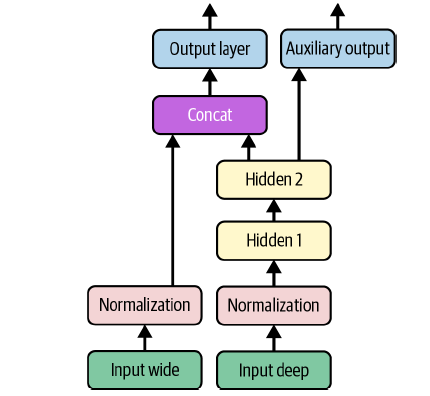

In [111]:
# Adding an extra output for regularization

# Inputs
input_wide = keras.layers.Input(shape=[5], name="wide_input")   # good idea to name inputs
input_deep = keras.layers.Input(shape=[6], name="deep_input")

# Normalization
norm_layer_wide = keras.layers.Normalization()
norm_layer_deep = keras.layers.Normalization()

# Normalization
norm_wide = norm_layer_wide(input_wide)
norm_deep = norm_layer_deep(input_deep)

# Hidden layers
hidden1 = keras.layers.Dense(30, activation="relu")(norm_deep)
hidden2 = keras.layers.Dense(30, activation="relu")(hidden1)
concat = keras.layers.concatenate([norm_wide, hidden2])

# Two output layers
# Main output connects to concat
output = keras.layers.Dense(1, name="main_output")(concat)
# Aux output connects to hidden2
aux_output = keras.layers.Dense(1, name="aux_output")(hidden2)

# Now we tell Model about the two outputs
model = keras.models.Model(inputs=[input_wide, input_deep],
                           outputs=[output, aux_output])

- Each output will need its own loss function.

- Therefore, when we compile the model, we should pass a list of losses (if we pass a single loss, Keras will assume that the same loss must be used for all outputs).

- By default, Keras will compute all these losses and simply add them up to get the final loss used for training.

- We care much more about the main output than about the auxiliary output (as it is just used for regularization), so we want to give the main output’s loss a much greater weight. 


In [112]:
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
model.compile(loss=("mse", "mse"), loss_weights=(0.9, 0.1), optimizer=optimizer,
                metrics=["RootMeanSquaredError"])

In [113]:
# Now we train with a tuple of outputs (just a repeat in this case)
norm_layer_wide.adapt(X_train_wide)
norm_layer_deep.adapt(X_train_deep)

history = model.fit((X_train_wide, X_train_deep), (y_train, y_train), epochs=10,
                    validation_data=((X_valid_wide, X_valid_deep), (y_valid, y_valid)))

Epoch 1/10
363/363 [==============================] - 2s 3ms/step - loss: 1.7659 - main_output_loss: 1.7385 - aux_output_loss: 2.0118 - main_output_root_mean_squared_error: 1.3185 - aux_output_root_mean_squared_error: 1.4184 - val_loss: 0.7867 - val_main_output_loss: 0.6373 - val_aux_output_loss: 2.1308 - val_main_output_root_mean_squared_error: 0.7983 - val_aux_output_root_mean_squared_error: 1.4597
Epoch 2/10
363/363 [==============================] - 1s 2ms/step - loss: 0.5800 - main_output_loss: 0.5655 - aux_output_loss: 0.7107 - main_output_root_mean_squared_error: 0.7520 - aux_output_root_mean_squared_error: 0.8430 - val_loss: 1.9280 - val_main_output_loss: 1.9548 - val_aux_output_loss: 1.6866 - val_main_output_root_mean_squared_error: 1.3982 - val_aux_output_root_mean_squared_error: 1.2987
Epoch 3/10
363/363 [==============================] - 1s 2ms/step - loss: 0.5038 - main_output_loss: 0.4926 - aux_output_loss: 0.6045 - main_output_root_mean_squared_error: 0.7019 - aux_output

When we evaluate the model, Keras will return the total loss, as well as all the
individual losses:

In [114]:
eval_results = model.evaluate((X_test_wide, X_test_deep), (y_test, y_test))
weighted_sum_of_losses, main_loss, aux_loss, main_rmse, aux_rmse = eval_results

162/162 [==============================] - 0s 1ms/step - loss: 0.3609 - main_output_loss: 0.3523 - aux_output_loss: 0.4378 - main_output_root_mean_squared_error: 0.5936 - aux_output_root_mean_squared_error: 0.6617


In [115]:
# The predict() method will return predictions for each output:
y_pred_main, y_pred_aux = model.predict((X_new_wide, X_new_deep))

1/1 [==============================] - 0s 120ms/step


In [116]:
y_pred_tuple = model.predict((X_new_wide, X_new_deep))
y_pred = dict(zip(model.output_names, y_pred_tuple))

1/1 [==============================] - 0s 49ms/step


In [117]:
print(y_pred)

{'main_output': array([[0.46174598],
       [1.408116  ],
       [3.4448993 ]], dtype=float32), 'aux_output': array([[0.6690686],
       [1.4064875],
       [3.0814607]], dtype=float32)}


### Using the Subclassing API to Build Dynamic Models

- Both the Sequential API and the Functional API are **declarative**:
    - you start by declaring which layers you want to use and how they should be connected, and only then can you start feeding the model some data for training or inference.
    - Many advantages: the model can easily be saved, cloned, and shared; its structure can be displayed and analyzed; the framework can infer shapes and check types, so errors can be caught early. 
    - It’s also fairly easy to debug, since the whole model is a **static graph of layers**.
    


- Some models involve loops, varying shapes, conditional branching, and other dynamic behaviors.
- For such cases, or simply if you prefer a more imperative programming style, the Subclassing API is for you. 

- Simply subclass the `Model` class, create the layers you need in the constructor, and use them to perform the computations you want in the `call()` method.

- For example, creating an instance of the following WideAndDeepModel class gives us an equivalent model to the one we just built with the Functional API. You can
then compile it, evaluate it, and use it to make predictions, exactly like we just
did:

In [118]:
# A Wide and Deep NN using the subclassing API:

class WideAndDeepModel(keras.Model):
    def __init__(self, units=30, activation="relu", **kwargs):
        # Call the parent constructor with any extra args
        super().__init__(**kwargs)
        # Create processing layers (units and activation are parameterized)
        self.norm_layer_wide = keras.layers.Normalization()
        self.norm_layer_deep = keras.layers.Normalization()
        self.hidden1 = keras.layers.Dense(units, activation=activation)
        self.hidden2 = keras.layers.Dense(units, activation=activation)
        # Watchout! Model class already has a property named output.
        self.main_output = keras.layers.Dense(1)
        self.aux_output = keras.layers.Dense(1)
        
    def call(self, inputs):
        """
        Build the model using a tuple of inputs
        """
        input_wide, input_deep = inputs
        # Apply normalization
        norm_wide = self.norm_layer_wide(input_wide)
        norm_deep = self.norm_layer_deep(input_deep)
        # Apply hidden1 to norm_deep
        hidden1 = self.hidden1(norm_deep)
        # Now we can apply hidden2 to hidden1
        hidden2 = self.hidden2(hidden1)
        # Concatenate 
        concat = keras.layers.concatenate([norm_wide, hidden2])
        # Apply main_output layer to concat
        main_output = self.main_output(concat)
        # Apply aux_output layer to hidden2
        aux_output = self.aux_output(hidden2)
        # Return the output layers
        return main_output, aux_output


# Example use (30 neurons per layer, relu activation)
model = WideAndDeepModel(20, activation="selu", name="my_cool_model")

In [119]:
model.norm_layer_wide.adapt(X_train_wide)
model.norm_layer_deep.adapt(X_train_deep)

model.compile(loss="mse",
              loss_weights=[0.9, 0.1],
              optimizer=optimizer)

In [120]:
history = model.fit((X_train_wide, X_train_deep), (y_train, y_train),
                    epochs=10,
                    validation_data=((X_valid_wide, X_valid_deep), (y_valid, y_valid)))

Epoch 1/10
363/363 [==============================] - 2s 3ms/step - loss: 0.8905 - output_1_loss: 0.8334 - output_2_loss: 1.4047 - val_loss: 1.0992 - val_output_1_loss: 0.5560 - val_output_2_loss: 5.9878
Epoch 2/10
363/363 [==============================] - 1s 2ms/step - loss: 0.5076 - output_1_loss: 0.4782 - output_2_loss: 0.7724 - val_loss: 0.6720 - val_output_1_loss: 0.4338 - val_output_2_loss: 2.8159
Epoch 3/10
363/363 [==============================] - 1s 2ms/step - loss: 0.4721 - output_1_loss: 0.4457 - output_2_loss: 0.7101 - val_loss: 0.5491 - val_output_1_loss: 0.4093 - val_output_2_loss: 1.8064
Epoch 4/10
363/363 [==============================] - 1s 2ms/step - loss: 0.4565 - output_1_loss: 0.4322 - output_2_loss: 0.6745 - val_loss: 0.4881 - val_output_1_loss: 0.3913 - val_output_2_loss: 1.3592
Epoch 5/10
363/363 [==============================] - 1s 2ms/step - loss: 0.4461 - output_1_loss: 0.4228 - output_2_loss: 0.6557 - val_loss: 0.4495 - val_output_1_loss: 0.3891 - val_ou

- The big difference is that you can do pretty much anything youwant in the `call()` method:
    - for loops, if statements, low-level TensorFlow operations...
    - Great API for researchers experimenting with new ideas.


- This extra flexibility does come at a cost:
    - model’s architecture is hidden within the call() method, so Keras cannot easily inspect it;
    - it cannot save or clone it; and when you call the summary() method, you only get a list of layers, without any information on how they are connected to each other.
    - Moreover, Keras cannot check types and shapes ahead of time, and it is easier to make mistakes.
 
 
#### Unless you really need that extra flexibility, you should probably stick to the Sequential API or the Functional API.

In [121]:
model.summary()

Model: "my_cool_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_10 (Normaliza  multiple                 11        
 tion)                                                           
                                                                 
 normalization_11 (Normaliza  multiple                 13        
 tion)                                                           
                                                                 
 dense_28 (Dense)            multiple                  140       
                                                                 
 dense_29 (Dense)            multiple                  420       
                                                                 
 dense_30 (Dense)            multiple                  26        
                                                                 
 dense_31 (Dense)            multiple                

### Saving and Restoring a Model

When using the Sequential API or the Functional API, saving a trained Keras
model is as simple as it gets:


In [122]:
model.save("my_keras_model", save_format="tf")

INFO:tensorflow:Assets written to: my_keras_model\assets


- When you set `save_format="tf"`, Keras saves the model using TensorFlow’s Saved‐Model format

- This is a directory (with the given name) containing several files and subdirectories.

- In particular, the saved_model.pb file contains the model’s architecture and logic in the form of a serialized computation graph, so you don’t need to deploy the model’s source code in order to use it in production; the SavedModel is sufficient

- The keras_metadata.pb file contains extra information needed by Keras.

- The variables subdirectory contains all the parameter values (including the connection weights, the biases, the normalization statistics, and the optimizer’s parameters), possibly split across multiple files if the model is very large.

- Lastly, the assets directory may contain extra files, such as data samples, feature names, class names, and so on.

- You will typically have a script that trains a model and saves it, and one or more scripts (or web services) that load the model and use it to make predictions.

- Loading the model is just as easy:

In [123]:
model = keras.models.load_model("my_keras_model")

In [125]:
y_pred_main, y_pred_aux = model.predict((X_new_wide, X_new_deep))

1/1 [==============================] - 0s 130ms/step


- You can also use `save_weights()` and `load_weights()` to save and load only the parameter values. 

- This includes the connection weights, biases, preprocessing stats, optimizer state, etc. The parameter values are saved in one or more files such as my_weights.data-00004-of-00052, plus an index file like my_weights.index.

In [126]:
model.save_weights("my_keras_weights.ckpt")

In [127]:
model.load_weights("my_keras_weights.ckpt")

### Using Callbacks

- The `fit()` method accepts a `callbacks` argument that lets you specify a list of objects that Keras will call:
    - at the start and end of training,
    - at the start and end of each epoch,
    - and even before and after processing each batch.
    
- For example, the `ModelCheckpoint` callback saves checkpoints of your model at regular intervals during training, by default at the end of each epoch:

In [28]:
# Create Checkpoint object
checkpoint_cb = keras.callbacks.ModelCheckpoint("my_checkpoints",
                                                save_best_only=True)

In [ ]:
# Supply callback to fit() method 
history = model.fit(...,  callbacks=[checkpoint_cb])

- If you use a validation set during training, you can set `save_best_only=True` when creating the ModelCheckpoint. It will only save your model when its performance on the validation set is the best so far.

- Simply restore the last model saved after training, and this will be the best model on the validation set.

In [ ]:
# Early stopping callback
early_stopping_cb = keras.callbacks.EarlyStopping(patience=10,
                                                  restore_best_weights=True)

# Save checkpoint AND stop early AND roll back to best model
history = model.fit(...,  callbacks=[checkpoint_cb, early_stopping_cb])


- There are many other callbacks available in the keras.callbacks package:
https://keras.io/callbacks/

- You can also define your own custom callbacks:

In [54]:
class PrintValTrainRatioCallback(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        print("\nval/train: {:.2f}".format(logs["val_loss"] / logs["loss"]))

In [55]:
val_train_ratio_cb = PrintValTrainRatioCallback()
history = model.fit(...,  callbacks=[val_train_ratio_cb])

312/363 [========================>.....] - ETA: 0s - loss: 0.3630
val/train: 0.96
363/363 [==============================] - 0s 1ms/step - loss: 0.3652 - val_loss: 0.3511


### Using TensorBoard for Visualization

- `TensorBoard` is a great interactive visualization tool that you can use to view the learning curves during training, compare learning curves between multiple runs,
visualize the computation graph, analyze training statistics, etc.
    - Installed automatically when you install TensorFlow.


- To use it, you must modify your program so that it outputs the data you want to visualize to special binary log files called **event files**.

- Each binary data record is called a **summary**.

- The TensorBoard server will monitor the log directory, and it will automatically pick up the changes and update the visualizations: this allows you to visualize live data (with a short delay), such as the learning curves during training.

- In general, you want to point the TensorBoard server to a root log directory and configure your program so that it writes to a different subdirectory every time it runs.
    - allows you to visualize and compare data from multiple runs of your program, without getting everything mixed up.


In [18]:
from pathlib import Path
from time import strftime

# root log directory we will use for our TensorBoard logs
root_logdir = os.path.join(os.curdir, "my_logs")

def get_run_logdir(root_logdir=root_logdir):
    return Path(root_logdir) / strftime("run_%Y_%m_%d_%H_%M_%S")

run_logdir = get_run_logdir() # e.g., my_logs/run_2022_08_01_17_25_59
print(f"{run_logdir=}")

run_logdir=WindowsPath('my_logs/run_2024_11_12_16_46_04')


In [19]:
tf.keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [20]:
model_California.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 8)                17        
 n)                                                              
                                                                 
 dense (Dense)               (None, 50)                450       
                                                                 
 dense_1 (Dense)             (None, 50)                2550      
                                                                 
 dense_2 (Dense)             (None, 50)                2550      
                                                                 
 dense_3 (Dense)             (None, 1)                 51        
                                                                 
Total params: 5,618
Trainable params: 5,601
Non-trainable params: 17
_____________________________________________________

- Keras provides a convenient TensorBoard() callback that will take care of creating the log directory for you

- and it will create event files and write summaries to them during training

In [21]:
# TensorBoard Callback
tensorboard_cb = keras.callbacks.TensorBoard(run_logdir,
                                            profile_batch=(100, 200))

history = model_California.fit(X_train, y_train, epochs=10,
                    validation_data=(X_valid, y_valid),
                    callbacks=[tensorboard_cb])

Epoch 1/10
363/363 [==============================] - 3s 6ms/step - loss: 0.7429 - root_mean_squared_error: 0.8619 - val_loss: 0.4347 - val_root_mean_squared_error: 0.6593
Epoch 2/10
363/363 [==============================] - 1s 3ms/step - loss: 0.3796 - root_mean_squared_error: 0.6161 - val_loss: 1.7629 - val_root_mean_squared_error: 1.3277
Epoch 3/10
363/363 [==============================] - 1s 4ms/step - loss: 0.3664 - root_mean_squared_error: 0.6053 - val_loss: 0.3604 - val_root_mean_squared_error: 0.6003
Epoch 4/10
363/363 [==============================] - 1s 4ms/step - loss: 0.3417 - root_mean_squared_error: 0.5846 - val_loss: 0.7690 - val_root_mean_squared_error: 0.8769
Epoch 5/10
363/363 [==============================] - 1s 4ms/step - loss: 0.3313 - root_mean_squared_error: 0.5756 - val_loss: 2.7497 - val_root_mean_squared_error: 1.6582
Epoch 6/10
363/363 [==============================] - 1s 4ms/step - loss: 0.3436 - root_mean_squared_error: 0.5862 - val_loss: 0.3734 - val_

In [22]:
%reload_ext tensorboard
%tensorboard --logdir=./my_logs --port=6006

### Fine-Tuning Neural Network Hyperparameters

- The flexibility of neural networks is also one of their main drawbacks: there are many hyperparameters to tweak.

- Not only can you use any imaginable network architecture, but even in a simple MLP you can change the number of layers, the number of neurons per layer, the type of activation function to use in each layer, the weight initialization logic, the type of optimizer, its learning rate, the batch size, etc.


- One option is to simply try many combinations of hyperparameters and see which one works best on the validation set (or use K-fold cross-validation).
    - Use `GridSearchCV` or `RandomizedSearchCV` to explore the hyperparameter space
    - To do this, we need to wrap our Keras models in objects that mimic regular Scikit-Learn regressors.
    
- The first step is to create a function that will build and compile a Keras model, given a set of hyperparameters:

In [23]:
def build_model(n_hidden=1,
                n_neurons=30,
                activation="relu",
                learning_rate=3e-3,
                optimizer=keras.optimizers.SGD,
                loss="mse",
                input_shape=X_train.shape[1:]): 
    """
    Builds a sequential model with the given hyperparameters
    """
    model = keras.models.Sequential()
    model.add(keras.layers.InputLayer(input_shape=input_shape))
    for layer in range(n_hidden):
        model.add(keras.layers.Dense(n_neurons, activation=activation))   
    model.add(keras.layers.Dense(1))
    # Set the learning rate and compile 
    optimizer_ = optimizer(learning_rate=learning_rate)
    model.compile(loss=loss, optimizer=optimizer_)
    return model

In [24]:
try:
    import scikeras
except ImportError:
    !pip install -q -U scikeras
    import scikeras

ERROR: Could not find a version that satisfies the requirement scikeras (from versions: none)
ERROR: No matching distribution found for scikeras


ModuleNotFoundError: No module named 'scikeras'

In [53]:
from scikeras.wrappers import KerasRegressor

In [74]:
keras_reg = KerasRegressor(
    model=build_model,
    n_hidden=1, n_neurons=30, activation="relu",
    learning_rate=3e-3, optimizer=keras.optimizers.SGD,
)

- The `KerasRegressor` object is a thin wrapper around the Keras model built using the build_model() function.

- We can use this object like a regular Scikit-Learn regressor: we can train it using its
`fit()` method, then evaluate it using its `score()` method, and use it to make predictions using its `predict()` method.

In [75]:
keras_reg.fit(X_train, y_train, epochs=3,
              validation_data=(X_valid, y_valid),
              callbacks=[keras.callbacks.EarlyStopping(patience=1)])

Epoch 1/3
1719/1719 [==============================] - 4s 2ms/step - loss: 8.6149 - val_loss: 8.3822
Epoch 2/3
1719/1719 [==============================] - 3s 2ms/step - loss: 8.2617 - val_loss: 8.3738
Epoch 3/3
1719/1719 [==============================] - 3s 2ms/step - loss: 8.2542 - val_loss: 8.4585


KerasRegressor(
	model=<function build_model at 0x000001D96939EB80>
	build_fn=None
	warm_start=False
	random_state=None
	optimizer=<class 'keras.src.optimizers.sgd.SGD'>
	loss=None
	metrics=None
	batch_size=None
	validation_batch_size=None
	verbose=1
	callbacks=None
	validation_split=0.0
	shuffle=True
	run_eagerly=False
	epochs=1
	n_hidden=1
	n_neurons=30
	activation=relu
	learning_rate=0.003
)

- Any extra parameter you pass to the `fit()` method will get passed to the underlying Keras model.

- The score will be the opposite of the MSE because Scikit-Learn wants scores, not losses (i.e., higher should be better).

- We want to train hundreds of variants and see which one performs best on the validation set. Since there are many hyperparameters, it is preferable to use a randomized search rather than grid search:

### There’s a better way: the Keras Tuner library

- Hyperparameter tuning library for Keras models

In [80]:
!pip install -q -U keras_tuner

In [25]:
import keras_tuner as kt

ModuleNotFoundError: No module named 'keras_tuner'

- We need a function that builds, compiles, and returns a Keras model.

- The function must take a `kt.HyperParameters` object as an argument, which it can use to define hyperparameters (integers, floats, strings, etc.) along with their range of possible values

- These hyperparameters may be used to build and compile the model.

- For example, the following function builds and compiles an MLP to classify Fashion MNIST images:

In [82]:
def build_model(hp):
    # Check whether n_hidden is in hp and satisfies conditions
    n_hidden = hp.Int("n_hidden",
                      min_value=0, max_value=8, default=2)
    # Same for n_neurons - min_value is default
    n_neurons = hp.Int("n_neurons",
                       min_value=16, max_value=256)
    learning_rate = hp.Float("learning_rate",
                             min_value=1e-4,
                             max_value=1e-2,
                             sampling="log")
    optimizer = hp.Choice("optimizer", values=["sgd", "adam"])
    if optimizer == "sgd":
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
    else:
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Flatten())
    for _ in range(n_hidden):
        model.add(tf.keras.layers.Dense(n_neurons, activation="relu"))
    
    model.add(tf.keras.layers.Dense(10, activation="softmax"))
    model.compile(loss="sparse_categorical_crossentropy",
                  optimizer=optimizer,
                  metrics=["accuracy"])
    return model

- Basic random search:

In [ ]:
random_search_tuner = kt.RandomSearch(
    build_model,
    objective="val_accuracy",
    max_trials=5, overwrite=True,
    directory="my_fashion_mnist",
    project_name="my_rnd_search",
    seed=42)

random_search_tuner.search(X_train, y_train,
                           epochs=10,
                           validation_data=(X_valid, y_valid))

### Not so basic

- In some cases, you may want to fine-tune data preprocessing hyperparameters, or `model.fit()` arguments, such as the batch size. For this, you must use a slightly different technique:

1. instead of writing a `build_model()` function, you must subclass the `kt.HyperModel` class and define two methods, `build()` and `fit()`.

    - The `build()` method does the exact same thing as the `build_model()` function.
    
    - The `fit()` method takes a HyperParameters object and a compiled model as an argument, as well as all the `model.fit()` arguments, and fits the model and returns the `History` object.
    
- Crucially, the `fit()` method may use hyperparameters to decide how to preprocess the data, tweak the batch size, and more.

In [83]:
class MyClassificationHyperModel(kt.HyperModel):
    
    def build(self, hp):
        # reuse our previous code
        return build_model(hp)
    
    def fit(self, hp, model, X, y, **kwargs):
        # Check if we should standardize input data
        if hp.Boolean("normalize"):
            norm_layer = keras.layers.Normalization()
            X = norm_layer(X)
            
        return model.fit(X, y, **kwargs)

In [ ]:
# This tuner is similar to the HalvingRandomSearchCV class
# it starts by training many different models for few epochs,
# then it keeps only the top 1/factor models
# repeating this selection process until a single model is left
hyperband_tuner = kt.Hyperband(
    MyClassificationHyperModel(),
    objective="val_accuracy", seed=42,
    max_epochs=10,
    factor=3, hyperband_iterations=2,
    overwrite=True,
    directory="my_fashion_mnist", project_name="hyperband")


#### It still helps to have an idea of what values are reasonable for each hyperparameter

- Number of Hidden Layers
    - For many problems, you can begin with a single hidden layer and get reasonable results.
    - An MLP with just one hidden layer can theoretically model even the most complex functions, provided it has enough neurons.
    - For complex problems, deep networks have a much higher parameter efficiency than shallow ones.
    - Real-world data is often structured in a hierarchical way, and deep neural networks automatically take advantage of this fact: lower hidden layers model low-level structures (e.g., line segments of various shapes and orientations), intermediate hidden layers combine these low-level structures to model intermediate-level structures (e.g., squares, circles), and the highest hidden layers and the output layer combine these intermediate structures to model high-level structures (e.g., faces).
    
    
- Number of Neurons per Hidden Layer
    - The number of neurons in the input and output layers is determined by the type of input and output your task requires.
    - As for the hidden layers, it used to be common to size them to form a pyramid, with fewer and fewer neurons at each layer—the rationale being that many lowlevel features can coalesce into far fewer high-level features.
    - However, this practice has been largely abandoned because it seems that using the same number of neurons in all hidden layers performs just as well in most cases, or even better; plus, there is only one hyperparameter to tune, instead of one per layer.
    
    
- In general you will get more bang for your buck by increasing the number of layers instead of the number of neurons per layer.


- Learning rate
    - The learning rate is arguably the most important hyperparameter.
    - In general, the optimal learning rate is about half of the maximum learning rate (i.e., the learning rate above which the training algorithm diverges).
    - One way to find a good learning rate is to train the model for a few hundred iterations, starting with a very low learning rate (e.g., 10e-5) and gradually increasing it up to a very large value (e.g., 10).
    - This is done by multiplying the learning rate by a constant factor at each iteration (e.g., by exp(log(10 )/500) to go from 10 to 10 in 500 iterations).
    - If you plot the loss as a function of the learning rate (using a log scale for the learning rate), you should see it dropping at first. But after a while, the learning rate will be too large, so the loss will shoot back up: the optimal learning rate will be a bit lower than the point at which the loss starts to climb.
    - You can then reinitialize your model and train it normally using this good learning rate.

---

---

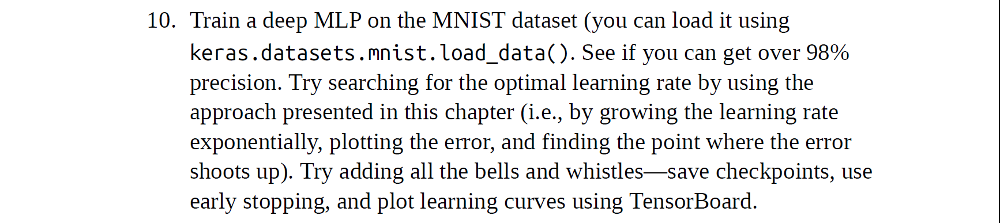

In [114]:
from tensorflow.keras.datasets.mnist import load_data

(x_train, y_train), (x_test, y_test) = load_data()

In [115]:
x_train.shape
y_train.shape
x_test.shape
y_test.shape

(60000, 28, 28)

(60000,)

(10000, 28, 28)

(10000,)

In [116]:
x_train.dtype

# Normalize
x_train = x_train / 256.0
x_test = x_test / 256.0

x_train.dtype

dtype('uint8')

dtype('float64')

In [117]:
x_train[0,15]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.17578125,
       0.7265625 , 0.98828125, 0.98828125, 0.5859375 , 0.10546875,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        ])

In [118]:
from sklearn.model_selection import train_test_split

# Create a valid 
x_train, x_valid, y_train, y_valid = train_test_split(x_train,
                                                      y_train,
                                                      test_size=0.15,
                                                      random_state=42)

In [127]:
    pd.Series(y_train).value_counts(sort=False)

0    5032
1    5751
2    5062
3    5227
4    4970
5    4594
6    5040
7    5302
8    4986
9    5036
dtype: int64

In [186]:

def build_model(n_hidden=1, n_neurons=30,
                learning_rate=3e-3, input_shape=[28, 28],
                activation="relu"):
    """ Builds a sequential model with the given hyperparameters
    """
    model = keras.models.Sequential()
    model.add(keras.layers.Flatten(input_shape=input_shape, name="input_layer"))
    
    for layer in range(n_hidden):
        # hidden layers
        model.add(keras.layers.Dense(n_neurons,
                                     activation=activation,
                                     name="hidden_layer_" + str(layer + 1)))
    # Output layer
    model.add(keras.layers.Dense(10, activation='softmax', name="output_layer"))
    
    # Set the learning rate and compile
    optimizer = keras.optimizers.SGD(lr=learning_rate)
    model.compile(loss="sparse_categorical_crossentropy",
                  optimizer=optimizer, metrics=["sparse_categorical_accuracy"])
    return model

In [187]:
model = build_model(n_hidden=2, n_neurons=30, learning_rate=7e-3)

In [188]:
model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (Flatten)        (None, 784)               0         
_________________________________________________________________
hidden_layer_1 (Dense)       (None, 30)                23550     
_________________________________________________________________
hidden_layer_2 (Dense)       (None, 30)                930       
_________________________________________________________________
output_layer (Dense)         (None, 10)                310       
Total params: 24,790
Trainable params: 24,790
Non-trainable params: 0
_________________________________________________________________


In [189]:
# TensorBoard Callback
tensorboard_cb = keras.callbacks.TensorBoard(get_run_logdir())
# Early Stopping Callback
early_cb = keras.callbacks.EarlyStopping(patience=10,restore_best_weights=True)

history = model.fit(x_train, y_train, epochs=150,
                  validation_data=(x_valid, y_valid),
                  callbacks=[early_cb, tensorboard_cb])

Train on 51000 samples, validate on 9000 samples
Epoch 1/150
51000/51000 [==============================] - 5s 93us/sample - loss: 1.1174 - sparse_categorical_accuracy: 0.6776 - val_loss: 0.4913 - val_sparse_categorical_accuracy: 0.8634
Epoch 2/150
51000/51000 [==============================] - 3s 67us/sample - loss: 0.4089 - sparse_categorical_accuracy: 0.8865 - val_loss: 0.3608 - val_sparse_categorical_accuracy: 0.8989
Epoch 3/150
51000/51000 [==============================] - 4s 76us/sample - loss: 0.3346 - sparse_categorical_accuracy: 0.9064 - val_loss: 0.3156 - val_sparse_categorical_accuracy: 0.9091
Epoch 4/150
51000/51000 [==============================] - 4s 87us/sample - loss: 0.2995 - sparse_categorical_accuracy: 0.9152 - val_loss: 0.2901 - val_sparse_categorical_accuracy: 0.9154
Epoch 5/150
51000/51000 [==============================] - 5s 107us/sample - loss: 0.2754 - sparse_categorical_accuracy: 0.9216 - val_loss: 0.2680 - val_sparse_categorical_accuracy: 0.9208
Epoch 6/15

51000/51000 [==============================] - 5s 96us/sample - loss: 0.0752 - sparse_categorical_accuracy: 0.9791 - val_loss: 0.1201 - val_sparse_categorical_accuracy: 0.9631
Epoch 45/150
51000/51000 [==============================] - 5s 94us/sample - loss: 0.0741 - sparse_categorical_accuracy: 0.9790 - val_loss: 0.1201 - val_sparse_categorical_accuracy: 0.9632
Epoch 46/150
51000/51000 [==============================] - 5s 94us/sample - loss: 0.0725 - sparse_categorical_accuracy: 0.9795 - val_loss: 0.1177 - val_sparse_categorical_accuracy: 0.9636
Epoch 47/150
51000/51000 [==============================] - 5s 97us/sample - loss: 0.0714 - sparse_categorical_accuracy: 0.9800 - val_loss: 0.1167 - val_sparse_categorical_accuracy: 0.9640
Epoch 48/150
51000/51000 [==============================] - 5s 100us/sample - loss: 0.0699 - sparse_categorical_accuracy: 0.9803 - val_loss: 0.1168 - val_sparse_categorical_accuracy: 0.9650
Epoch 49/150
51000/51000 [==============================] - 5s 103u

In [191]:
keras_clf = keras.wrappers.scikit_learn.KerasRegressor(build_model)

In [ ]:
from scipy.stats import reciprocal
from sklearn.model_selection import RandomizedSearchCV

param_distribs = {
    "n_hidden": [3],
    "n_neurons": np.arange(30, 100),
    "learning_rate": reciprocal(5e-3, 5e-2),
}

rnd_search_cv = RandomizedSearchCV(keras_clf,
                                   param_distribs,
                                   n_iter=20, cv=3, verbose=1)

rnd_search_cv.fit(x_train, y_train, epochs=150,
                  validation_data=(x_valid, y_valid),
                  callbacks=[early_cb])

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Train on 34000 samples, validate on 9000 samples
Epoch 1/150
34000/34000 [==============================] - 3s 102us/sample - loss: 0.8319 - sparse_categorical_accuracy: 0.7656 - val_loss: 0.3681 - val_sparse_categorical_accuracy: 0.8913
Epoch 2/150
34000/34000 [==============================] - 3s 83us/sample - loss: 0.3258 - sparse_categorical_accuracy: 0.9053 - val_loss: 0.2873 - val_sparse_categorical_accuracy: 0.9136
Epoch 3/150
34000/34000 [==============================] - 3s 85us/sample - loss: 0.2634 - sparse_categorical_accuracy: 0.9231 - val_loss: 0.2468 - val_sparse_categorical_accuracy: 0.9279
Epoch 4/150
34000/34000 [==============================] - 3s 90us/sample - loss: 0.2243 - sparse_categorical_accuracy: 0.9345 - val_loss: 0.2111 - val_sparse_categorical_accuracy: 0.9336
Epoch 5/150
34000/34000 [==============================] - 3s 91us/sample - loss: 0.1964 - sparse_categorical_accuracy: 0.9422 - val_loss: 0.1982 - val_sparse_categorical_accuracy: 0.9383
Epoch 6/15

34000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 34000 samples, validate on 9000 samples
Epoch 1/150
34000/34000 [==============================] - 5s 139us/sample - loss: 0.8001 - sparse_categorical_accuracy: 0.7792 - val_loss: 0.3550 - val_sparse_categorical_accuracy: 0.8964
Epoch 2/150
34000/34000 [==============================] - 4s 112us/sample - loss: 0.3089 - sparse_categorical_accuracy: 0.9098 - val_loss: 0.2886 - val_sparse_categorical_accuracy: 0.9132
Epoch 3/150
34000/34000 [==============================] - 4s 114us/sample - loss: 0.2460 - sparse_categorical_accuracy: 0.9280 - val_loss: 0.2259 - val_sparse_categorical_accuracy: 0.9331
Epoch 4/150
34000/34000 [==============================] - 4s 112us/sample - loss: 0.2080 - sparse_categorical_accuracy: 0.9391 - val_loss: 0.2028 - val_sparse_categorical_accuracy: 0.9359
Epoch 5/150
34000/34000 [==============================] - 4s 111us/sample - loss: 0.1805 - sparse_categorical_accuracy: 0.9458 - val_loss: 0.1873 - val_sparse_categorical_accuracy: 0.9421
Epoch 

34000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 34000 samples, validate on 9000 samples
Epoch 1/150
34000/34000 [==============================] - 5s 145us/sample - loss: 0.8120 - sparse_categorical_accuracy: 0.7755 - val_loss: 0.3887 - val_sparse_categorical_accuracy: 0.8841
Epoch 2/150
34000/34000 [==============================] - 4s 120us/sample - loss: 0.3323 - sparse_categorical_accuracy: 0.9040 - val_loss: 0.3025 - val_sparse_categorical_accuracy: 0.9121
Epoch 3/150
34000/34000 [==============================] - 4s 123us/sample - loss: 0.2723 - sparse_categorical_accuracy: 0.9225 - val_loss: 0.2540 - val_sparse_categorical_accuracy: 0.9252
Epoch 4/150
34000/34000 [==============================] - 4s 117us/sample - loss: 0.2331 - sparse_categorical_accuracy: 0.9340 - val_loss: 0.2283 - val_sparse_categorical_accuracy: 0.9317
Epoch 5/150
34000/34000 [==============================] - 4s 117us/sample - loss: 0.2022 - sparse_categorical_accuracy: 0.9422 - val_loss: 0.1977 - val_sparse_categorical_accuracy: 0.9399
Epoch 

34000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 34000 samples, validate on 9000 samples
Epoch 1/150
34000/34000 [==============================] - 5s 134us/sample - loss: 0.6946 - sparse_categorical_accuracy: 0.8066 - val_loss: 0.3499 - val_sparse_categorical_accuracy: 0.8971
Epoch 2/150
34000/34000 [==============================] - 4s 124us/sample - loss: 0.3058 - sparse_categorical_accuracy: 0.9115 - val_loss: 0.2700 - val_sparse_categorical_accuracy: 0.9190
Epoch 3/150
34000/34000 [==============================] - 5s 151us/sample - loss: 0.2428 - sparse_categorical_accuracy: 0.9289 - val_loss: 0.2294 - val_sparse_categorical_accuracy: 0.9342
Epoch 4/150
34000/34000 [==============================] - 4s 116us/sample - loss: 0.2040 - sparse_categorical_accuracy: 0.9410 - val_loss: 0.1981 - val_sparse_categorical_accuracy: 0.9416
Epoch 5/150
34000/34000 [==============================] - 4s 116us/sample - loss: 0.1761 - sparse_categorical_accuracy: 0.9486 - val_loss: 0.1938 - val_sparse_categorical_accuracy: 0.9408
Epoch 

34000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 34000 samples, validate on 9000 samples
Epoch 1/150
34000/34000 [==============================] - 5s 142us/sample - loss: 0.7342 - sparse_categorical_accuracy: 0.7911 - val_loss: 0.3430 - val_sparse_categorical_accuracy: 0.8997
Epoch 2/150
34000/34000 [==============================] - 4s 108us/sample - loss: 0.2917 - sparse_categorical_accuracy: 0.9141 - val_loss: 0.2702 - val_sparse_categorical_accuracy: 0.9168
Epoch 3/150
34000/34000 [==============================] - 4s 116us/sample - loss: 0.2275 - sparse_categorical_accuracy: 0.9325 - val_loss: 0.2094 - val_sparse_categorical_accuracy: 0.9373
Epoch 4/150
34000/34000 [==============================] - 4s 125us/sample - loss: 0.1879 - sparse_categorical_accuracy: 0.9451 - val_loss: 0.1860 - val_sparse_categorical_accuracy: 0.9431
Epoch 5/150
34000/34000 [==============================] - 5s 155us/sample - loss: 0.1600 - sparse_categorical_accuracy: 0.9529 - val_loss: 0.1723 - val_sparse_categorical_accuracy: 0.9477
Epoch 

34000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 34000 samples, validate on 9000 samples
Epoch 1/150
34000/34000 [==============================] - 5s 161us/sample - loss: 0.7480 - sparse_categorical_accuracy: 0.7865 - val_loss: 0.3492 - val_sparse_categorical_accuracy: 0.8899
Epoch 2/150
34000/34000 [==============================] - 4s 116us/sample - loss: 0.2894 - sparse_categorical_accuracy: 0.9160 - val_loss: 0.2564 - val_sparse_categorical_accuracy: 0.9240
Epoch 3/150
34000/34000 [==============================] - 4s 121us/sample - loss: 0.2294 - sparse_categorical_accuracy: 0.9334 - val_loss: 0.2046 - val_sparse_categorical_accuracy: 0.9390
Epoch 4/150
34000/34000 [==============================] - 4s 112us/sample - loss: 0.1898 - sparse_categorical_accuracy: 0.9449 - val_loss: 0.2117 - val_sparse_categorical_accuracy: 0.9350
Epoch 5/150
34000/34000 [==============================] - 4s 105us/sample - loss: 0.1604 - sparse_categorical_accuracy: 0.9530 - val_loss: 0.1703 - val_sparse_categorical_accuracy: 0.9468
Epoch 

34000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 34000 samples, validate on 9000 samples
Epoch 1/150


In [2]:
rnd_search_cv

NameError: name 'rnd_search_cv' is not defined